<span style="color:#ED145B; font-size:32px; font-weight:bold; font-family:'Segoe UI';">
1 Crescimento e Receita
</span>

<span style="color:wheite; font-size:14px; font-family:'Segoe UI';">

</span>

In [2]:
# Importando Bibliotecas de suporte 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import json
from urllib.request import urlopen
import locale



<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.1 Reconhecendo as TabelasReconhecendo as Tabelas
</h1>

<p style="font-size:14px;">
Este conjunto de dados foi gentilmente cedido pela Olist, a maior loja de departamentos em marketplaces brasileiros. A Olist conecta pequenos negócios de todo o Brasil a canais de distribuição de forma descomplicada e com um único contrato. Esses comerciantes podem vender seus produtos pela Loja Olist e enviá-los diretamente aos clientes utilizando os parceiros logísticos da Olist. Saiba mais em nosso site: www.olist.com
Após um cliente comprar um produto na Olist Store, o vendedor é notificado para processar o pedido. Assim que o cliente recebe o produto, ou quando a data de entrega estimada se aproxima, ele recebe uma pesquisa de satisfação por e-mail, onde pode deixar sua opinião sobre a experiência de compra e escrever comentários.
</p>




In [3]:
df_customers = pd.read_csv('olist_customers_dataset.csv')  #Clientes          
df_geolocation = pd.read_csv('olist_geolocation_dataset.csv')  #geolocalização       
df_order_items = pd.read_csv('olist_order_items_dataset.csv') #Itens do pedido          
df_payments = pd.read_csv('olist_order_payments_dataset.csv') #Pagamento        
df_reviews = pd.read_csv('olist_order_reviews_dataset.csv') # Comentários
df_orders = pd.read_csv('olist_orders_dataset.csv')  #Pedidos               
df_products = pd.read_csv('olist_products_dataset.csv') #Produtos               
df_sellers = pd.read_csv('olist_sellers_dataset.csv') #Vendedores       
df_category_translation = pd.read_csv('product_category_name_translation.csv') #Categoria_Tradução

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.2 Customers
</h1>

<p style="font-size:14px;">
Este conjunto de dados contém informações sobre o cliente e sua localização. 
Possível identificar clientes únicos no conjunto de dados de pedidos e para encontrar o local de entrega dos pedidos. 
Cada pedido é atribuído a um `customer_id` único. Isso significa que o mesmo cliente receberá IDs diferentes para pedidos diferentes. 
O objetivo de ter um `customer_unique_id` no conjunto de dados é permitir a identificação de clientes que fizeram compras repetidas na loja. 
Caso contrário, cada pedido estaria associado a um cliente diferente.
</p>



| Campo                     | Descrição |
|----------------------------|-----------|
| `customer_id`             | Chave para o conjunto de dados de pedidos. Cada pedido possui um `customer_id` único. |
| `customer_unique_id`      | Identificador único de um cliente. |
| `customer_zip_code_prefix`| Primeiros cinco dígitos do CEP do cliente. |
| `customer_city`           | Nome da cidade do cliente. |
| `customer_state`          | Estado (UF) do cliente. |

In [ ]:
df_customers.head(5)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [ ]:
# Colunas: 5
# Linhas: 9.9441
df_customers.shape

(99441, 5)

In [ ]:
# Texto e Número Inteiro
df_customers.dtypes

customer_id                   str
customer_unique_id            str
customer_zip_code_prefix    int64
customer_city                 str
customer_state                str
dtype: object

In [ ]:
# Nenhuma linha em branco/vazia
df_customers.isnull().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [ ]:
# Valores únicos
df_customers.nunique()

customer_id                 99441
customer_unique_id          96096
customer_zip_code_prefix    14994
customer_city                4119
customer_state                 27
dtype: int64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.3 Geolocation
</h1>

<p style="font-size:14px;">
Este conjunto de dados contém informações sobre os CEPs brasileiros e suas coordenadas de latitude e longitude. 
Utilizado para criar mapas e calcular distâncias entre vendedores e clientes.
</p>

Dicionário de Dados - Geolocation
| Campo | Descrição |
|--------|-----------|
| `geolocation_zip_code_prefix` | Primeiros cinco dígitos do código postal (CEP). |
| `geolocation_lat` | Latitude da localização. |
| `geolocation_lng` | Longitude da localização. |
| `geolocation_city` | Nome da cidade associada ao CEP. |
| `geolocation_state` | Estado (UF) associado ao CEP. |

In [ ]:
df_geolocation.head(5)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [ ]:
# Colunas: 5
# Linhas: 1.000.163
df_geolocation.shape

(1000163, 5)

In [ ]:
# Texto, Número Inteiro e Número Decimal
df_geolocation.dtypes

geolocation_zip_code_prefix      int64
geolocation_lat                float64
geolocation_lng                float64
geolocation_city                   str
geolocation_state                  str
dtype: object

In [ ]:
# Nenhuma linha em branco/vazia
df_geolocation.isnull().sum()

geolocation_zip_code_prefix    0
geolocation_lat                0
geolocation_lng                0
geolocation_city               0
geolocation_state              0
dtype: int64

In [ ]:
# Valores únicos
df_geolocation.nunique()

geolocation_zip_code_prefix     19015
geolocation_lat                717360
geolocation_lng                717613
geolocation_city                 8011
geolocation_state                  27
dtype: int64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.4 Order Items
</h1>

<p style="font-size:14px;">
Este conjunto de dados inclui informações sobre os itens comprados em cada pedido.
Exemplo:O pedido com ID = 00143d0f86d6fbd9f9b38ab440ac16f5contém 3 itens (do mesmo produto). O frete de cada item é calculado de acordo com suas dimensões e peso. Para obter o valor total do frete de cada pedido, basta somá-los.

O valor total do item do pedido é: 21.33 * 3 = 63.99

O valor total do frete é: 15.10 * 3 = 45.30

O valor total do pedido (produto + frete) é: 45.30 + 63.99 = 109.29
</p>

Dicionário de Dados - Order Items
| Campo | Descrição |
|--------|-----------|
| `order_id` | Identificador único do pedido. |
| `order_item_id` | Número sequencial que identifica a quantidade de itens incluídos no mesmo pedido. |
| `product_id` | Identificador único do produto. |
| `seller_id` | Identificador único do vendedor. |
| `shipping_limit_date` | Data limite para que o vendedor envie o pedido ao parceiro logístico. |
| `price` | Preço do item. |
| `freight_value` | Valor do frete do item. Em pedidos com múltiplos itens, o frete é dividido entre eles. |

In [ ]:
df_order_items.head(5)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [ ]:
# Colunas: 7
# Linhas: 112.650
df_order_items.shape

(112650, 7)

In [ ]:
# Texto, Número Inteiro e Número Decimal
df_order_items.dtypes

order_id                   str
order_item_id            int64
product_id                 str
seller_id                  str
shipping_limit_date        str
price                  float64
freight_value          float64
dtype: object

In [ ]:
# Nenhuma linha em branco/vazia
df_order_items.isnull().sum()

order_id               0
order_item_id          0
product_id             0
seller_id              0
shipping_limit_date    0
price                  0
freight_value          0
dtype: int64

In [ ]:
# Valores únicos
df_order_items.nunique()

order_id               98666
order_item_id             21
product_id             32951
seller_id               3095
shipping_limit_date    93318
price                   5968
freight_value           6999
dtype: int64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.5 Order Payments
</h1>

<p style="font-size:14px;">
Este conjunto de dados inclui informações sobre as opções de pagamento dos pedidos.
</p>

Dicionário de Dados - Order Payments

| Campo | Descrição |
|--------|-----------|
| `order_id` | Identificador único do pedido. |
| `payment_sequential` | Número sequencial do pagamento. Um mesmo pedido pode ser pago utilizando mais de um método de pagamento. |
| `payment_type` | Método de pagamento escolhido pelo cliente. |
| `payment_installments` | Número de parcelas escolhido pelo cliente. |
| `payment_value` | Valor da transação realizada. |

In [ ]:
df_payments.head(5)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [ ]:
# Colunas: 5
# Linhas: 103.886
df_payments.shape

(103886, 5)

In [ ]:
# Texto, Número Inteiro e Número Decimal
df_payments.dtypes

order_id                    str
payment_sequential        int64
payment_type                str
payment_installments      int64
payment_value           float64
dtype: object

In [ ]:
# Nenhuma linha em branco/vazia
df_payments.isnull().sum()

order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [ ]:
# Valores únicos
df_payments.nunique()

order_id                99440
payment_sequential         29
payment_type                5
payment_installments       24
payment_value           29077
dtype: int64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.6 Order Reviews
</h1>

<p style="font-size:14px;">
Este conjunto de dados inclui informações sobre as avaliações feitas pelos clientes. Após um cliente comprar um produto na Olist Store, o vendedor é notificado para processar o pedido. Assim que o cliente recebe o produto, ou quando a data de entrega estimada se aproxima, ele recebe uma pesquisa de satisfação por e-mail, onde pode deixar sua opinião sobre a experiência de compra e escrever comentários.
</p>

Dicionário de Dados - Order Reviews
| Campo | Descrição |
|--------|-----------|
| `review_id` | Identificador único da avaliação. |
| `order_id` | Identificador único do pedido. |
| `review_score` | Nota de 1 a 5 atribuída pelo cliente na pesquisa de satisfação. |
| `review_comment_title` | Título do comentário deixado pelo cliente. |
| `review_comment_message` | Mensagem da avaliação deixada pelo cliente. |
| `review_creation_date` | Data em que a pesquisa de satisfação foi enviada ao cliente. |
| `review_answer_timestamp` | Data e hora em que o cliente respondeu à pesquisa de satisfação. |

In [ ]:
df_reviews.head(5)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [ ]:
# Colunas: 7
# Linhas: 99.224
df_reviews.shape

(99224, 7)

In [ ]:
# Texto e Números Inteiros
df_reviews.dtypes

review_id                    str
order_id                     str
review_score               int64
review_comment_title         str
review_comment_message       str
review_creation_date         str
review_answer_timestamp      str
dtype: object

In [ ]:
# Colunas de Titulos e Mensagens com linhas vazias / em branco
df_reviews.isnull().sum()

review_id                      0
order_id                       0
review_score                   0
review_comment_title       87656
review_comment_message     58247
review_creation_date           0
review_answer_timestamp        0
dtype: int64

In [ ]:
# Valores únicos
df_reviews.nunique()

review_id                  98410
order_id                   98673
review_score                   5
review_comment_title        4527
review_comment_message     36159
review_creation_date         636
review_answer_timestamp    98248
dtype: int64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.7 Orders Dataset
</h1>

<p style="font-size:14px;">
Este é o conjunto de dados principal. A partir de cada pedido, você pode encontrar todas as outras informações.
</p>

Dicionário de Dados - Orders
| Campo | Descrição |
|--------|-----------|
| `order_id` | Identificador único do pedido. |
| `customer_id` | Chave para o conjunto de dados de clientes. Cada pedido possui um `customer_id` associado. |
| `order_status` | Status atual do pedido (entregue, enviado, cancelado, processando, entre outros). |
| `order_purchase_timestamp` | Data e hora em que a compra foi realizada. |
| `order_approved_at` | Data e hora da aprovação do pagamento. |
| `order_delivered_carrier_date` | Data e hora em que o pedido foi entregue ao parceiro logístico para transporte. |
| `order_delivered_customer_date` | Data real de entrega do pedido ao cliente. |
| `order_estimated_delivery_date` | Data de entrega estimada informada ao cliente no momento da compra. |

In [ ]:
df_orders.head(5)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [ ]:
# Período de compras: 2016-09-04 21:15:19 a 2018-10-17 17:30:18
df_orders['order_purchase_timestamp'].agg(['min', 'max'])

min    2016-09-04 21:15:19
max    2018-10-17 17:30:18
Name: order_purchase_timestamp, dtype: str

In [ ]:
# Colunas: 8
# Linhas: 99.441
df_orders.shape

(99441, 8)

In [ ]:
# Textos
df_orders.dtypes

order_id                         str
customer_id                      str
order_status                     str
order_purchase_timestamp         str
order_approved_at                str
order_delivered_carrier_date     str
order_delivered_customer_date    str
order_estimated_delivery_date    str
dtype: object

In [ ]:
# Colunas de Aprovação de Pagamentos, Data de Postagem e Data de Entrega do Pedido com linhas vazias / em branco
df_orders.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [ ]:
# Valores únicos
df_orders.nunique()

order_id                         99441
customer_id                      99441
order_status                         8
order_purchase_timestamp         98875
order_approved_at                90733
order_delivered_carrier_date     81018
order_delivered_customer_date    95664
order_estimated_delivery_date      459
dtype: int64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.8 Products
</h1>

<p style="font-size:14px;">
Este conjunto de dados inclui informações sobre os produtos vendidos pela Olist.
</p>

Dicionário de Dados - Products
| Campo | Descrição |
|--------|-----------|
| `product_id` | Identificador único do produto. |
| `product_category_name` | Categoria principal do produto. |
| `product_name_lenght` | Número de caracteres do nome do produto. |
| `product_description_lenght` | Número de caracteres da descrição do produto. |
| `product_photos_qty` | Quantidade de fotos publicadas do produto. |
| `product_weight_g` | Peso do produto em gramas. |
| `product_length_cm` | Comprimento do produto em centímetros. |
| `product_height_cm` | Altura do produto em centímetros. |
| `product_width_cm` | Largura do produto em centímetros. |

In [ ]:
df_products.head(5)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [ ]:
# Colunas: 9
# Linhas: 32.951
df_products.shape

(32951, 9)

In [ ]:
# Textos e Números Inteiros
df_products.dtypes

product_id                        str
product_category_name             str
product_name_lenght           float64
product_description_lenght    float64
product_photos_qty            float64
product_weight_g              float64
product_length_cm             float64
product_height_cm             float64
product_width_cm              float64
dtype: object

In [ ]:
# Diversas Colunas com linhas em branco / vazias
df_products.isnull().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [ ]:
# Valores únicos
df_products.nunique()

product_id                    32951
product_category_name            73
product_name_lenght              66
product_description_lenght     2960
product_photos_qty               19
product_weight_g               2204
product_length_cm                99
product_height_cm               102
product_width_cm                 95
dtype: int64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.9 Sellers
</h1>

<p style="font-size:14px;">
Este conjunto de dados inclui informações sobre os vendedores que processaram pedidos feitos na Olist. Utilizado para encontrar a localização do vendedor e identificar qual vendedor processou cada produto.
</p>

Dicionário de Dados - Sellers
| Campo | Descrição |
|--------|-----------|
| `seller_id` | Identificador único do vendedor. |
| `seller_zip_code_prefix` | Primeiros cinco dígitos do CEP do vendedor. |
| `seller_city` | Nome da cidade do vendedor. |
| `seller_state` | Estado (UF) do vendedor. |

In [ ]:
df_sellers.head(5)

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [ ]:
# Colunas: 4
# Linhas: 3.095
df_sellers.shape

(3095, 4)

In [ ]:
# Textos e Número Inteiro
df_sellers.dtypes

seller_id                   str
seller_zip_code_prefix    int64
seller_city                 str
seller_state                str
dtype: object

In [ ]:
# Nenhuma Colunas com Linhas em branco / vazia
df_sellers.isnull().sum()

seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
dtype: int64

In [ ]:
# Valores únicos
df_sellers.nunique()

seller_id                 3095
seller_zip_code_prefix    2246
seller_city                611
seller_state                23
dtype: int64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.10 Product Category Translation
</h1>

<p style="font-size:14px;">
Traduz o nome da categoria do produto para inglês.
</p>

Dicionário de Dados - Product Category Name Translation
| Campo | Descrição |
|--------|-----------|
| `product_category_name` | Nome da categoria do produto em português. |
| `product_category_name_english` | Nome da categoria do produto em inglês. |

In [ ]:
df_category_translation.head(5)

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [ ]:
# Colunas: 2
# Linhas: 71
df_category_translation.shape

(71, 2)

In [ ]:
# Textos
df_category_translation.dtypes

product_category_name            str
product_category_name_english    str
dtype: object

In [ ]:
# Nenhuma Colunas com Linhas em branco / vazia
df_category_translation.isnull().sum()

product_category_name            0
product_category_name_english    0
dtype: int64

In [ ]:
# Valores únicos
df_category_translation.nunique()

product_category_name            71
product_category_name_english    71
dtype: int64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.11 Tratamento de Dados
</h1>

<p style="font-size:14px;">
Validação de duplicidades e linhas em branco, Conversão de datas para o formato de datas, Padronização de nome de colunas/informações
</p>

In [ ]:
#Identificar e Remover Duplicados
dfs = {'Orders': df_orders, 'Customers': df_customers, 'Items': df_order_items, 'Sellers': df_sellers}

print("Verificação de Linhas Duplicadas:")
for nome, df in dfs.items():
    qtd_duplicados = df.duplicated().sum()
    print(f"Tabela {nome}: {qtd_duplicados} linhas duplicadas encontradas.")
    if qtd_duplicados > 0:
        df.drop_duplicates(inplace=True)
        print(f"-> Duplicados removidos da tabela {nome}.")

Verificação de Linhas Duplicadas:
Tabela Orders: 0 linhas duplicadas encontradas.
Tabela Customers: 0 linhas duplicadas encontradas.
Tabela Items: 0 linhas duplicadas encontradas.
Tabela Sellers: 0 linhas duplicadas encontradas.


In [ ]:
# Informações em branco na tabela principal
df_orders.dropna(subset=['order_id', 'customer_id'], inplace=True)

# Tabela de itens: considerando colunas de preço e o frete (importantes para a receita)
df_order_items.dropna(subset=['price', 'freight_value'], inplace=True)

# Tabelas de cadastro e localização e ID são importantes
df_customers.dropna(subset=['customer_id', 'customer_zip_code_prefix'], inplace=True)
df_sellers.dropna(subset=['seller_id', 'seller_zip_code_prefix'], inplace=True)

print("Exclusão de linhas importantes em branco, se houver." \
" Porém os campos específicos não contém valores nulos, conforme análises anteriores.")

Exclusão de linhas importantes em branco, se houver. Porém os campos específicos não contém valores nulos, conforme análises anteriores.


In [ ]:
# Conversão de Datas
colunas_data_orders = ['order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date']
for col in colunas_data_orders: df_orders[col] = pd.to_datetime(df_orders[col], errors='coerce')

# Coluna de data na tabela de itens (limite de envio do vendedor)
df_order_items['shipping_limit_date'] = pd.to_datetime(df_order_items['shipping_limit_date'], errors='coerce')

print("Formato de datas corrigido nas tabelas de Pedidos e Itens.")

Formato de datas corrigido nas tabelas de Pedidos e Itens.


In [ ]:
# Padronização de Colunas
df_customers.rename(columns={
    'customer_city': 'cidade',
    'customer_state': 'estado'
}, inplace=True)

df_sellers.rename(columns={
    'seller_city': 'cidade',
    'seller_state': 'estado'
}, inplace=True)

print("Nomes das colunas de Cidade e Estado padronizados.")

Nomes das colunas de Cidade e Estado padronizados.


<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.12 Crescimento e Receita
</h1>

<p style="font-size:14px;">
Essa análise nos ajudará a responder as seguintes perguntas
</p>

<ul style="font-size:14px;">
    <li>As vendas no setor do E-commerce Brasileiro tem crescido? Como se comportou no período analisado (04/09/2016 a 17/10/2018)?</li>
    <li>Quais regiões tem maior participação nesse resultado obtido?</li>
    <li>Quais são os produtos e os vendedores que mais contribuíram para este cenário?</li>
</ul>

<p style="font-size:14px;">
Tratamento
</p>
<ul style="font-size:14px;">
    <li>Evolução mensal de pedidos, receita e ticket médio</li>
    <li>Evolução Mensal dos Pedidos</li>
    <li>Utilizando apenas a tabela Orders, considerando o total de pedidos realizados por mês em cada ano</li>
</ul>



In [ ]:
# Evolução mensal da quantidade de pedidos (sem olhar para valores)
ev_mensal = df_orders.copy()
# Inserindo uma coluna com mês e ano para visualizar a evolução
ev_mensal['pedidos_mes_ano'] = ev_mensal['order_purchase_timestamp'].dt.to_period('M')
# Somando o total de pedidos ('order_id') por mês/ano e colocando em ordem cronológica
pedidos_mensal = ev_mensal.groupby('pedidos_mes_ano')['order_id'].nunique().reset_index()
pedidos_mensal = pedidos_mensal.sort_values('pedidos_mes_ano')

pedidos_mensal.head(5)

,pedidos_mes_ano,order_id
0,2016-09,4
1,2016-10,324
2,2016-12,1
3,2017-01,800
4,2017-02,1780


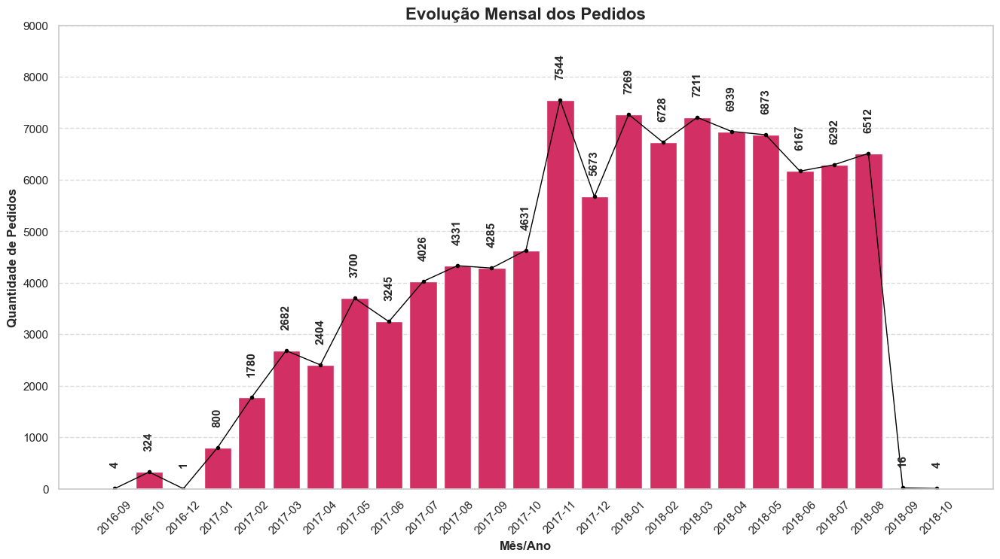

In [ ]:
plt.figure(figsize=(16,8))
sns.barplot(data=pedidos_mensal, x = 'pedidos_mes_ano', y = 'order_id', color='#ED145B')
plt.title('Evolução Mensal dos Pedidos', fontsize = 16, fontweight='bold')
plt.xlabel('Mês/Ano', fontsize = 12, fontweight='bold')
plt.xticks(rotation = 45)
plt.ylabel('Quantidade de Pedidos', fontsize = 12, fontweight='bold')
plt.ylim(0, 9000)
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
plt.bar_label(plt.gca().containers[0], padding=20, fontsize=11, rotation=90, fontweight='bold')
linha = plt.plot(pedidos_mensal['order_id'], color="#000000", linewidth=1, marker='o', markersize=3, label='pedidos_mes_ano')

plt.show()

<p style="font-size:14px;">
Analisando o dado (gráfico)
</p>

<p style="font-size:14px;">
O dataset da Olist disponibiliza o histórico de vendas de novembro de 2016 a outubro de 2018, total de de 24 meses. A Olist nasceu como startup no final de 2014, porém o modelo de plataforma integradora de marketplaces ganhou escala nacional ao longo de 2017, o que explica a baixa quantidade de pedidos realizados em 2016 e o crescimento no ano seguinte. A queda significativa de pedidos em setembro e outubro de 2018, vista no gráfico apresentado, não tem relação com a diminuição de pedidos reais ou queda no setor do e-commerce. Foi uma estratégia comercial e de segurança da Olist, rao realizar um corte no banco de dados, considerando os meses incompletos, para publicar o dataset no Kaggle. Após a Olist atingir escala mundial e crescer o total de pedidos, pode-se notar que o e-commerce manteve o total de vendas mensais acima de 6 mil nos últimos 8 meses do conjunto de dados, excluindo setembro e outubro de 2018 visto a extração incompleta destes meses. 
</p>




<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.13 Evolução Mensal da Receita
</h1>

<p style="font-size:14px;">
Utilizando a tabela Payments, considerando o valor total gasto nos pedidos.
Os pedidos podem se repetir de acordo com o pagamento, mas o valor do pagamento é separado por payment_sequential
</p>

In [ ]:
# Como se comportam os order_id repetidos
pedidos_duplicados = df_payments['order_id'].value_counts()
pedidos_duplicados = pedidos_duplicados[pedidos_duplicados > 1].reset_index()

# Visualizando o primeiro order_id que aparece mais de uma vez
exemplo_id = pedidos_duplicados.iloc[0]['order_id']

# Filtro para o order_id de exemplo
caso_duplicado = df_payments[df_payments['order_id'] == exemplo_id]

caso_duplicado

,order_id,payment_sequential,payment_type,payment_installments,payment_value
4885,fa65dad1b0e818e3ccc5cb0e39231352,27,voucher,1,66.02
9985,fa65dad1b0e818e3ccc5cb0e39231352,4,voucher,1,29.16
14321,fa65dad1b0e818e3ccc5cb0e39231352,1,voucher,1,3.71
17274,fa65dad1b0e818e3ccc5cb0e39231352,9,voucher,1,1.08
19565,fa65dad1b0e818e3ccc5cb0e39231352,10,voucher,1,12.86
23074,fa65dad1b0e818e3ccc5cb0e39231352,2,voucher,1,8.51
24879,fa65dad1b0e818e3ccc5cb0e39231352,25,voucher,1,3.68
28330,fa65dad1b0e818e3ccc5cb0e39231352,5,voucher,1,0.66
29648,fa65dad1b0e818e3ccc5cb0e39231352,6,voucher,1,5.02
32519,fa65dad1b0e818e3ccc5cb0e39231352,11,voucher,1,4.03


In [ ]:
# Criando uma tabela com o valor total de cada pedido
valor_total = df_payments.groupby('order_id')['payment_value'].sum().reset_index()

valor_total.head(5)

,order_id,payment_value
0,00010242fe8c5a6d1ba2dd792cb16214,72.19
1,00018f77f2f0320c557190d7a144bdd3,259.83
2,000229ec398224ef6ca0657da4fc703e,216.87
3,00024acbcdf0a6daa1e931b038114c75,25.78
4,00042b26cf59d7ce69dfabb4e55b4fd9,218.04


In [ ]:
# Juntando a tabela Orders com a tabela Valor_Total para relacionar a data do pedido ao valor
receita = df_orders.merge(valor_total, on='order_id', how='left')

receita.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,179.12


In [ ]:
receita.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
payment_value                       1
dtype: int64

In [ ]:
# Excluindo linha em branco (total: 01)
receita.dropna(subset=['payment_value'], inplace=True)

In [ ]:
# Insenrindo uma coluna de Mês/Ano
receita['pedidos_mes_ano'] = receita['order_purchase_timestamp'].dt.to_period('M')
# Somando o total de valores (payment_value) por mês/ano e colocando em ordem cronológica
receita_mensal = receita.groupby('pedidos_mes_ano')['payment_value'].sum().reset_index()
receita_mensal = receita_mensal.sort_values('pedidos_mes_ano')

receita_mensal.head()

,pedidos_mes_ano,payment_value
0,2016-09,252.24
1,2016-10,59090.48
2,2016-12,19.62
3,2017-01,138488.04
4,2017-02,291908.01


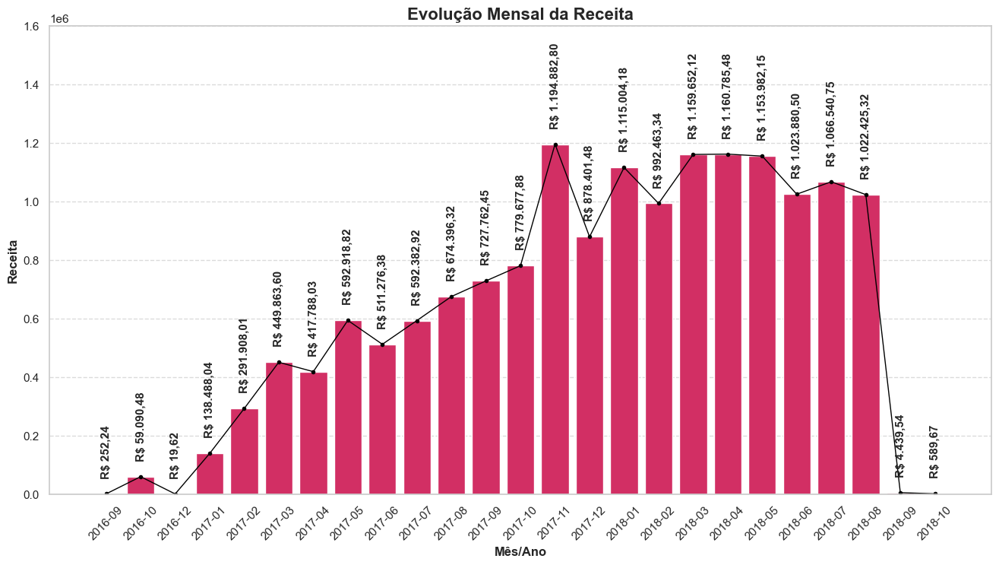

In [ ]:
plt.figure(figsize=(16,8))
sns.barplot(data=receita_mensal, x = 'pedidos_mes_ano', y = 'payment_value', color='#ED145B')
plt.title('Evolução Mensal da Receita', fontsize = 16, fontweight='bold')
plt.xlabel('Mês/Ano', fontsize = 12, fontweight='bold')
plt.xticks(rotation = 45)
plt.ylabel('Receita', fontsize = 12, fontweight='bold')
plt.ylim(0, 1600000)
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
linha = plt.plot(receita_mensal['payment_value'], color="#000000", linewidth=1, marker='o', markersize=3, label='pedidos_mes_ano')
valores_formatados = [f"R$ {val:,.2f}".replace(",", "v").replace(".", ",").replace("v", ".") for val in plt.gca().containers[0].datavalues]
plt.bar_label(plt.gca().containers[0], labels=valores_formatados, padding=15, fontsize=11, fontweight='bold', rotation=90)

plt.show()

<p style="font-size:14px;">
 Analisando o dado (gráfico):
</p>
 
 <p style="font-size:14px;">
 O crescimento mensal do faturamento está de acordo com a evolução do total de pedidos. Porém alguns meses chamam a atenção ao observar um desvio em relação à quantidade de pedidos e valor total de faturamento, como: Em 2018, no mês de março (7.211) foram, ao todo, 272 pedidos a mais que abril (6.939) e 338 a mais que maio (6.873). Mas, apesar destas diferenças e de março ter sido o mês com mais pedidos, os faturamentos mensais são muito próximos, inclusive com o mês de abril liderando em questão de valor. Considerando os meses em questão, é possível observar que abril e maio são meses com datas comemorativas que envolvem presentear outras pessoas (Páscoa e Dia das Mães), o que pode resultar em compras de produtos mais específicos e com valores mais altos devido à disposição do cliente em pagar um valor mais alto por presentes de maior valor agregado. Esse comportamento sazonal explica o pico de faturamento observado nesses meses, mesmo que o volume total de pedidos não mude drasticamente. Além das datas comemorativas, é possível observar que novembro de 2017 foi o mês com maior quantidade de compras e de maior faturamento. Este é um resultado da Black Friday, sendo o maior evento do e-commerce brasileiro, cujo os vendedores aproveitam para ofertar os seus produtos com descontos e os clientes antecipam as compras de fim de ano. 
</p>

 

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.15 Evolução Mensal do Ticket Médio
</h1>

<p style="font-size:14px;">
Receita Mensal por quantidade total de pedidos do mês. 
</p>




In [ ]:
# Agrupando por mês/ano para calcular faturamento, volume e o ticket médio
evolucao_ticket = receita.groupby('pedidos_mes_ano').agg(
    faturamento_mensal=('payment_value', 'sum'),
    total_pedidos=('order_id', 'count')
).reset_index()

# Calculando o ticket médio
evolucao_ticket['ticket_medio'] = (
    evolucao_ticket['faturamento_mensal'] / evolucao_ticket['total_pedidos']
)

evolucao_ticket = evolucao_ticket.sort_values('pedidos_mes_ano')

evolucao_ticket.head()

,pedidos_mes_ano,faturamento_mensal,total_pedidos,ticket_medio
0,2016-09,252.24,3,84.080000
1,2016-10,59090.48,324,182.378025
2,2016-12,19.62,1,19.620000
3,2017-01,138488.04,800,173.110050
4,2017-02,291908.01,1780,163.993264


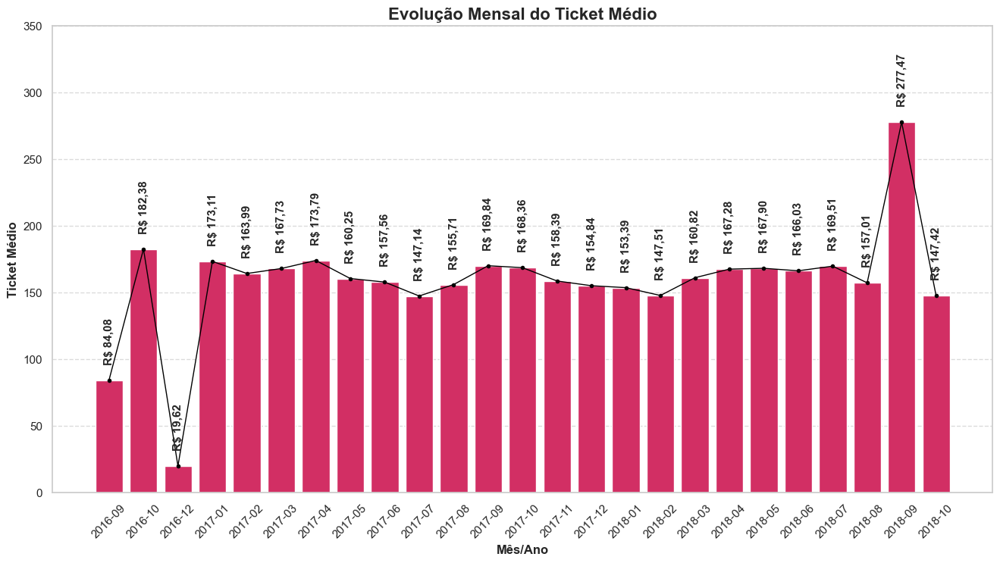

In [ ]:
plt.figure(figsize=(16,8))
sns.barplot(data=evolucao_ticket, x = 'pedidos_mes_ano', y = 'ticket_medio', color='#ED145B')
plt.title('Evolução Mensal do Ticket Médio', fontsize = 16, fontweight='bold')
plt.xlabel('Mês/Ano', fontsize = 12, fontweight='bold')
plt.xticks(rotation = 45)
plt.ylabel('Ticket Médio', fontsize = 12, fontweight='bold')
plt.ylim(0, 350)
plt.grid(axis = 'y', linestyle = '--', alpha = 0.7)
linha = plt.plot(evolucao_ticket['ticket_medio'], color="#000000", linewidth=1, marker='o', markersize=3, label='pedidos_mes_ano')
valores_formatados = [f"R$ {val:,.2f}".replace(",", "v").replace(".", ",").replace("v", ".") for val in plt.gca().containers[0].datavalues]
plt.bar_label(plt.gca().containers[0], labels=valores_formatados, padding=15, fontsize=11, fontweight='bold', rotation=90)

plt.show()

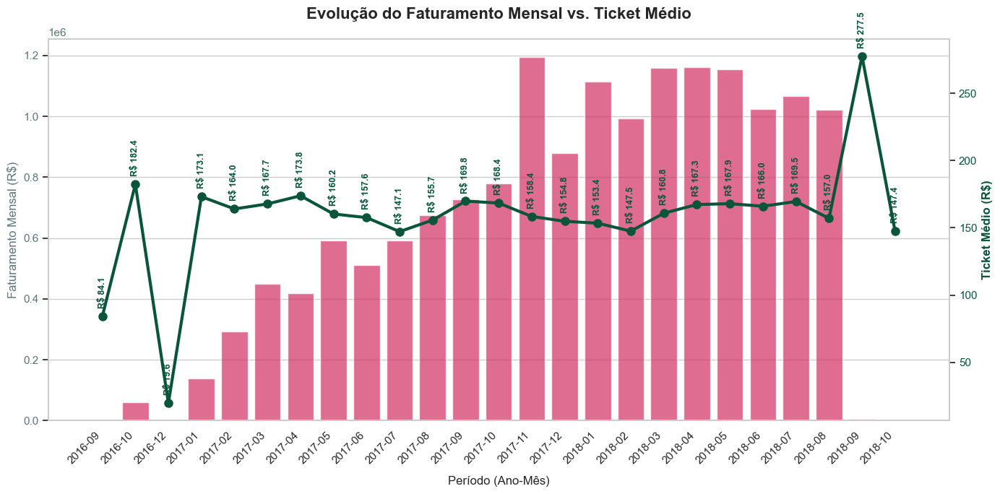

In [ ]:
evolucao_ticket['pedidos_mes_ano'] = evolucao_ticket['pedidos_mes_ano'].astype(str)
evolucao_ticket['ticket_medio'] = pd.to_numeric(evolucao_ticket['ticket_medio'], errors='coerce')
evolucao_ticket['faturamento_mensal'] = pd.to_numeric(evolucao_ticket['faturamento_mensal'], errors='coerce')

sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (14, 7)

fig, ax1 = plt.subplots()

# Faturamento Mensal (Eixo Esquerdo)
sns.barplot(
    data=evolucao_ticket, 
    x='pedidos_mes_ano', 
    y='faturamento_mensal', 
    ax=ax1, 
    color='#ED145B', 
    alpha=0.7
)

ax1.set_title('Evolução do Faturamento Mensal vs. Ticket Médio', fontsize=16, pad=20, fontweight='bold')
ax1.set_xlabel('Período (Ano-Mês)', fontsize=12, labelpad=10)
ax1.set_ylabel('Faturamento Mensal (R$)', fontsize=12, color='#5c767a')
ax1.tick_params(axis='y', labelcolor='#5c767a')

ax1.set_xticks(range(len(evolucao_ticket)))
ax1.set_xticklabels(evolucao_ticket['pedidos_mes_ano'], rotation=45, ha='right')

# Eixo Direito
ax2 = ax1.twinx()

ax2.plot(
    evolucao_ticket['pedidos_mes_ano'], 
    evolucao_ticket['ticket_medio'], 
    color='#09553c', 
    linewidth=3, 
    marker='o', 
    markersize=8,
    label='Ticket Médio'
)
ax2.set_ylabel('Ticket Médio (R$)', fontsize=12, color='#09553c', fontweight='bold')
ax2.tick_params(axis='y', labelcolor='#09553c')
ax2.grid(False) 

# Rótulo de Dados
for i, row in evolucao_ticket.reset_index(drop=True).iterrows():
    ax2.annotate(
        f"R$ {row['ticket_medio']:.1f}", 
        (i, row['ticket_medio']),
        textcoords="offset points", 
        xytext=(0,10), 
        ha='center', 
        fontsize=9, 
        fontweight='bold',
        rotation=90,
        color="#09553c"
    )

plt.tight_layout()
plt.show()

<p style="font-size:14px;">
 Analisando o dado (gráfico)
</p>

<p style="font-size:14px;">
 A evolução mensal do ticket médio reforça os resultados obtidos nos gráficos anteriores, justificando os valores mais altos em meses com datas comemorativas e consideravelmente mais baixo no mês da Black Friday. 
</p>



<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.16 Participação por categoria e região (UF/município)
</h1>

<p style="font-size:14px;">
Categorias mais vendidas e as que contribuíram para a receita total
</p>


In [ ]:
# Tabela com os pedidos e produtos processados pela Olist
df_order_items.nunique()

order_id               98666
order_item_id             21
product_id             32951
seller_id               3095
shipping_limit_date    93318
price                   5968
freight_value           6999
dtype: int64

In [ ]:
# Juntando as tabelas de Products com Items para visualizar o nome das categorias
df_itens_com_categoria = pd.merge(df_order_items, df_products[['product_id', 'product_category_name']], on='product_id', how='left')

df_itens_com_categoria.head(5)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,pet_shop
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,moveis_decoracao
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,perfumaria
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,ferramentas_jardim


In [ ]:
# Somando o total de itens vendidos em cada categoria e o valor total vendido (price)
categorias_ranking = df_itens_com_categoria.groupby('product_category_name').agg(total_vendas=('order_id', 'count'), faturamento_total=('price', 'sum')).reset_index()

categorias_ranking.head(5)

,product_category_name,total_vendas,faturamento_total
0,agro_industria_e_comercio,212,72530.47
1,alimentos,510,29393.41
2,alimentos_bebidas,278,15179.48
3,artes,209,24202.64
4,artes_e_artesanato,24,1814.01


In [ ]:
# Ordenando pelas categorias mais vendidas
categorias_ranking = categorias_ranking.sort_values(by='total_vendas', ascending=False)

categorias_ranking.head(10)

,product_category_name,total_vendas,faturamento_total
13,cama_mesa_banho,11115,1036988.68
11,beleza_saude,9670,1258681.34
32,esporte_lazer,8641,988048.97
54,moveis_decoracao,8334,729762.49
44,informatica_acessorios,7827,911954.32
72,utilidades_domesticas,6964,632248.66
66,relogios_presentes,5991,1205005.68
70,telefonia,4545,323667.53
40,ferramentas_jardim,4347,485256.46
8,automotivo,4235,592720.11


In [ ]:
# Separando o TOP 10 de Categorias mais vendidas
categorias_TOPranking = categorias_ranking.head(10)

categorias_TOPranking

,product_category_name,total_vendas,faturamento_total
13,cama_mesa_banho,11115,1036988.68
11,beleza_saude,9670,1258681.34
32,esporte_lazer,8641,988048.97
54,moveis_decoracao,8334,729762.49
44,informatica_acessorios,7827,911954.32
72,utilidades_domesticas,6964,632248.66
66,relogios_presentes,5991,1205005.68
70,telefonia,4545,323667.53
40,ferramentas_jardim,4347,485256.46
8,automotivo,4235,592720.11


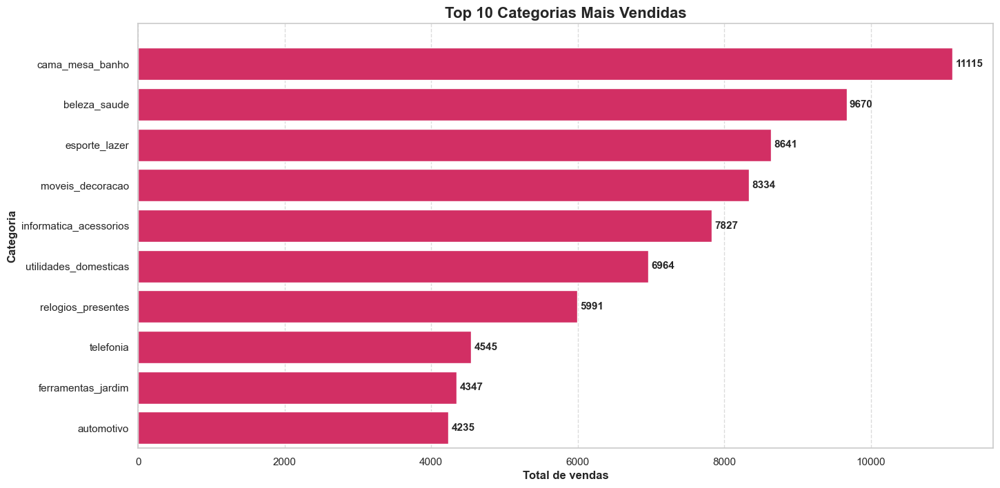

In [ ]:
categorias_TOPranking = categorias_TOPranking.sort_values(by='total_vendas', ascending=True)
plt.figure(figsize=(16,8))
sns.barplot(data=categorias_TOPranking, x = 'total_vendas', y = 'product_category_name', color='#ED145B')
plt.title('Top 10 Categorias Mais Vendidas', fontsize = 16, fontweight='bold')
plt.xlabel('Total de vendas', fontsize = 12, fontweight='bold')
plt.ylabel('Categoria', fontsize = 12, fontweight='bold')
plt.ylim(-0.5, 10)
plt.bar_label(plt.gca().containers[0], padding=3, fontsize=11, fontweight='bold')
plt.grid(axis = 'x', linestyle = '--', alpha = 0.7)

plt.show()

In [ ]:
# Ordenando pelas categorias com maior receira
categorias_ranking = categorias_ranking.sort_values(by='faturamento_total', ascending=False)

categorias_ranking.head(10)

,product_category_name,total_vendas,faturamento_total
11,beleza_saude,9670,1258681.34
66,relogios_presentes,5991,1205005.68
13,cama_mesa_banho,11115,1036988.68
32,esporte_lazer,8641,988048.97
44,informatica_acessorios,7827,911954.32
54,moveis_decoracao,8334,729762.49
26,cool_stuff,3796,635290.85
72,utilidades_domesticas,6964,632248.66
8,automotivo,4235,592720.11
40,ferramentas_jardim,4347,485256.46


In [ ]:
# Separando o TOP 10 de Categorias com mais contribuíram para a receita
categorias_TOPreceita = categorias_ranking.head(10)

categorias_TOPreceita

,product_category_name,total_vendas,faturamento_total
11,beleza_saude,9670,1258681.34
66,relogios_presentes,5991,1205005.68
13,cama_mesa_banho,11115,1036988.68
32,esporte_lazer,8641,988048.97
44,informatica_acessorios,7827,911954.32
54,moveis_decoracao,8334,729762.49
26,cool_stuff,3796,635290.85
72,utilidades_domesticas,6964,632248.66
8,automotivo,4235,592720.11
40,ferramentas_jardim,4347,485256.46


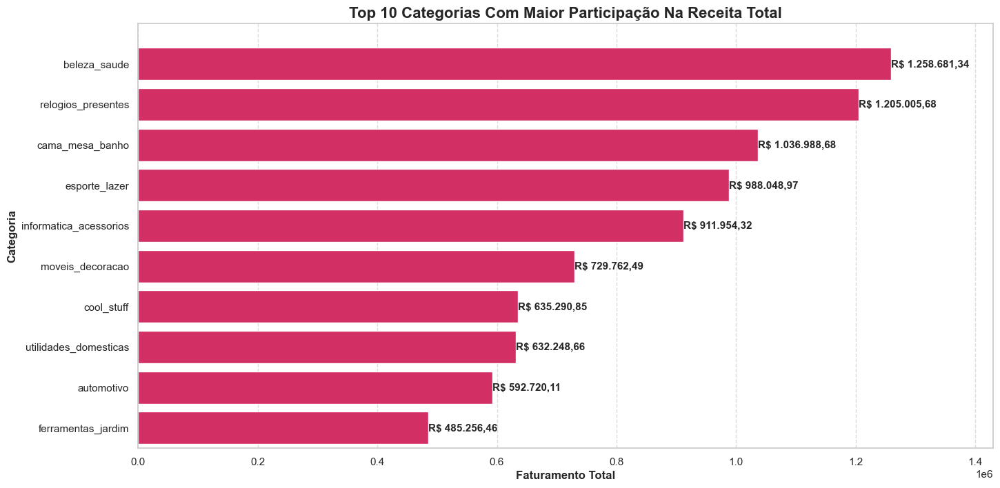

In [ ]:
categorias_TOPreceita = categorias_TOPreceita.sort_values(by='faturamento_total', ascending=True)
plt.figure(figsize=(16,8))
sns.barplot(data=categorias_TOPreceita, x = 'faturamento_total', y = 'product_category_name', color='#ED145B')
plt.title('Top 10 Categorias Com Maior Participação Na Receita Total', fontsize = 16, fontweight='bold')
plt.xlabel('Faturamento Total', fontsize = 12, fontweight='bold')
plt.ylabel('Categoria', fontsize = 12, fontweight='bold')
plt.ylim(-0.5, 10)
plt.xlim(-0.5, 1430000)
plt.grid(axis = 'x', linestyle = '--', alpha = 0.7)
valores_formatados = [f"R$ {val:,.2f}".replace(",", "v").replace(".", ",").replace("v", ".") for val in plt.gca().containers[0].datavalues]
plt.bar_label(plt.gca().containers[0], labels=valores_formatados, padding=0, fontsize=11, fontweight='bold')

plt.show()

<p style="font-size:14px;">
 Analisando o dado (gráfico)
</p>

<p style="font-size:14px;">
 Nesta análise é possível observar que as categorias mais vendidas não serão, necessariamente, as categoriam que mais contribuem para o faturamento. 
Apesar da categoria "cama_mesa_banho" ser a primeira colocada, com uma diferença de 1.445 pedidos a menos que "beleza_saude", ela se apresenta em terceiro lugar entre as categorias com maior faturamento. Já a categoria "beleza_saude", lidera o faturamento com R$ 221.692,66 a mais que "cama_mesa_banho". Já a categoria "telefonia", listada como a oitava mais vendida, não entra para o ranking de maior faturamento, dando o espaço para "cool_stuff" como a sétima com maior faturamento. 
</p>

<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.17 Região
</h1>

<p style="font-size:14px;">
Regiões com mais compras (participação) e as que mais contribuíram para a receita total
</p>




In [ ]:
# Juntando as tabelas Receita e Customers para ter a localização dos clientes
geografico = pd.merge(receita, df_customers[['customer_id', 'cidade', 'estado']], on='customer_id', how='left')

geografico.head(5)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_value,pedidos_mes_ano,cidade,estado
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,38.71,2017-10,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,141.46,2018-07,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,179.12,2018-08,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,72.20,2017-11,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,28.62,2018-02,santo andre,SP


In [ ]:
# Agrupando as colunas para gerar o ranking
ranking_regioes = geografico.groupby(['cidade', 'estado']).agg(total_pedidos=('order_id', 'count'), faturamento_total=('payment_value', 'sum')).reset_index()
ranking_regioes = ranking_regioes.sort_values(by='total_pedidos', ascending=False)

ranking_regioes.head(10)

,cidade,estado,total_pedidos,faturamento_total
3758,sao paulo,SP,15540,2203373.09
3281,rio de janeiro,RJ,6882,1161927.36
469,belo horizonte,MG,2773,421765.12
587,brasilia,DF,2131,354216.78
1187,curitiba,PR,1521,247392.48
739,campinas,SP,1444,216248.43
3080,porto alegre,RS,1379,224731.42
3375,salvador,BA,1245,218071.50
1587,guarulhos,SP,1189,165121.99
3574,sao bernardo do campo,SP,938,120434.84


In [ ]:
# Criando uma tabela com o total de pedidos por Estado
TOPranking_regioes = ranking_regioes.groupby('estado')['total_pedidos'].sum().reset_index()
TOPranking_regioes = TOPranking_regioes.sort_values(by='total_pedidos', ascending=False)

TOP10_regioes = TOPranking_regioes.head(10)

TOP10_regioes

,estado,total_pedidos
25,SP,41745
18,RJ,12852
10,MG,11635
22,RS,5466
17,PR,5045
23,SC,3637
4,BA,3380
6,DF,2140
7,ES,2033
8,GO,2020


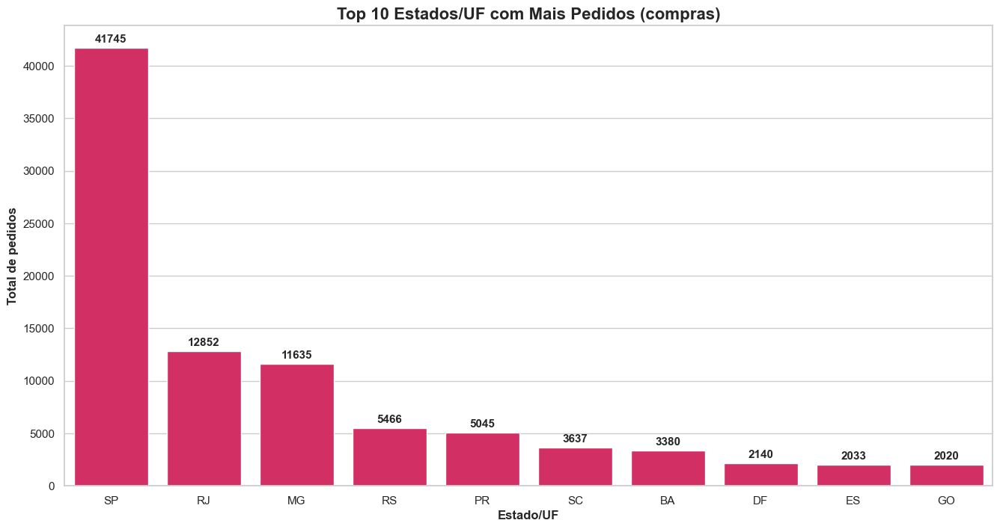

In [ ]:
TOP10_regioes = TOP10_regioes.sort_values(by='total_pedidos', ascending=False)

plt.figure(figsize=(16,8))
sns.barplot(data=TOP10_regioes, y = 'total_pedidos', x = 'estado', color='#ED145B')
plt.title('Top 10 Estados/UF com Mais Pedidos (compras)', fontsize = 16, fontweight='bold')
plt.ylabel('Total de pedidos', fontsize = 12, fontweight='bold')
plt.xlabel('Estado/UF', fontsize = 12, fontweight='bold')
plt.bar_label(plt.gca().containers[0], padding=3, fontsize=11, fontweight='bold')

plt.show()

In [ ]:
# Criando uma tabela com o total de receita por Estado
receita_regioes = ranking_regioes.groupby('estado')['faturamento_total'].sum().reset_index()
receita_regioes = receita_regioes.sort_values(by='faturamento_total', ascending=False)

TOPreceita_regioes = receita_regioes.head(10)

TOPreceita_regioes

,estado,faturamento_total
25,SP,5998226.96
18,RJ,2144379.69
10,MG,1872257.26
22,RS,890898.54
17,PR,811156.38
23,SC,623086.43
4,BA,616645.82
6,DF,355141.08
8,GO,350092.31
7,ES,325967.55


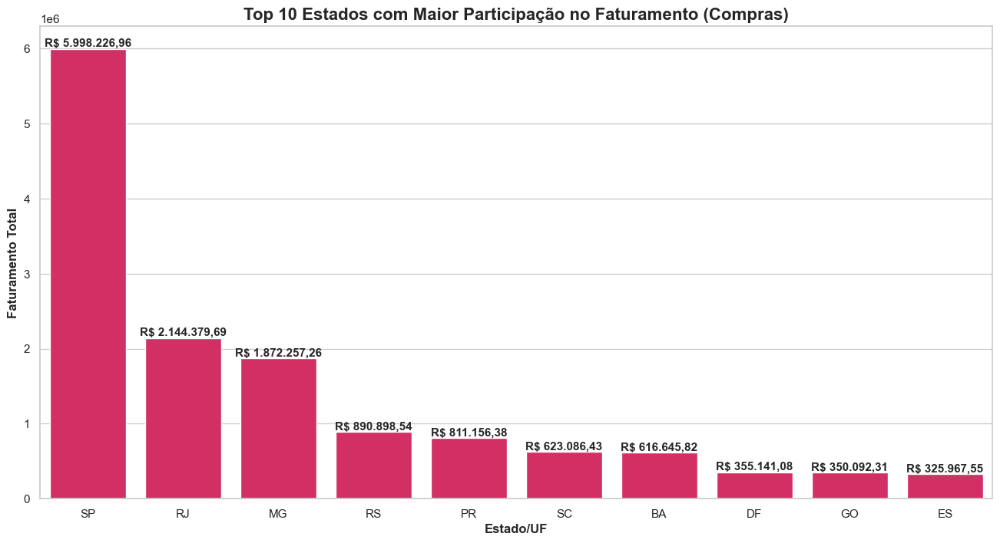

In [ ]:
TOPreceita_regioes = TOPreceita_regioes.sort_values(by='faturamento_total', ascending=False)

plt.figure(figsize=(16,8))
sns.barplot(data=TOPreceita_regioes, y = 'faturamento_total', x = 'estado', color='#ED145B')
plt.title('Top 10 Estados com Maior Participação no Faturamento (Compras)', fontsize = 16, fontweight='bold')
plt.ylabel('Faturamento Total', fontsize = 12, fontweight='bold')
plt.xlabel('Estado/UF', fontsize = 12, fontweight='bold')
valores_formatados = [f"R$ {val:,.2f}".replace(",", "v").replace(".", ",").replace("v", ".") for val in plt.gca().containers[0].datavalues]
plt.bar_label(plt.gca().containers[0], labels=valores_formatados, padding=0, fontsize=11, fontweight='bold')

plt.show()

<p style="font-size:14px;">
 Analisando o dado (gráfico)
</p>

<p style="font-size:14px;">
 Existe uma diferença discrepante entre o Estado com maior número de compras e faturamento, SP, em relação aos demais. É possível observar que o e-commerce no Brasil é altamente centralizado em SP, visto que o Estado possui mais clientes/compradores que os demais Estados do TOP 10 juntos. Essa concentração em SP se deve a questões demográficas, econômicas e logísticas, visto que o Estado de São Paulo é o mais populoso do Brasil, com maior circulação financeira e território de grandes indústrias. 
</p>



<h1 style="color:#ED145B; font-family:'Segoe UI';">
1.18 Identificação de produtos e sellers top performers
</h1>

<p style="font-size:14px;">
Vendendores que mais faturaram no e-commercer através da Olist.
</p>

In [ ]:
# Agrupando o total de vendas e o valor total vendido por cada vendedor
ranking_vendedores = df_order_items.groupby('seller_id').agg(total_itens_vendidos=('order_id', 'count'), faturamento_total=('price', 'sum')).reset_index()
ranking_vendedores = ranking_vendedores.sort_values(by='faturamento_total', ascending=False)

ranking_vendedores.head(5)

,seller_id,total_itens_vendidos,faturamento_total
857,4869f7a5dfa277a7dca6462dcf3b52b2,1156,229472.63
1013,53243585a1d6dc2643021fd1853d8905,410,222776.05
881,4a3ca9315b744ce9f8e9374361493884,1987,200472.92
3024,fa1c13f2614d7b5c4749cbc52fecda94,586,194042.03
1535,7c67e1448b00f6e969d365cea6b010ab,1364,187923.89


In [ ]:
# Noemando o vendedor por ranking para criar um gráfico
ranking_vendedores['ranking_vendedor'] = [f"{i+1}º Vendedor" for i in range(len(ranking_vendedores))]

ranking_vendedores.head(10)

,seller_id,total_itens_vendidos,faturamento_total,ranking_vendedor
857,4869f7a5dfa277a7dca6462dcf3b52b2,1156,229472.63,1º Vendedor
1013,53243585a1d6dc2643021fd1853d8905,410,222776.05,2º Vendedor
881,4a3ca9315b744ce9f8e9374361493884,1987,200472.92,3º Vendedor
3024,fa1c13f2614d7b5c4749cbc52fecda94,586,194042.03,4º Vendedor
1535,7c67e1448b00f6e969d365cea6b010ab,1364,187923.89,5º Vendedor
1560,7e93a43ef30c4f03f38b393420bc753a,340,176431.87,6º Vendedor
2643,da8622b14eb17ae2831f4ac5b9dab84a,1551,160236.57,7º Vendedor
1505,7a67c85e85bb2ce8582c35f2203ad736,1171,141745.53,8º Vendedor
192,1025f0e2d44d7041d6cf58b6550e0bfa,1428,138968.55,9º Vendedor
1824,955fee9216a65b617aa5c0531780ce60,1499,135171.70,10º Vendedor


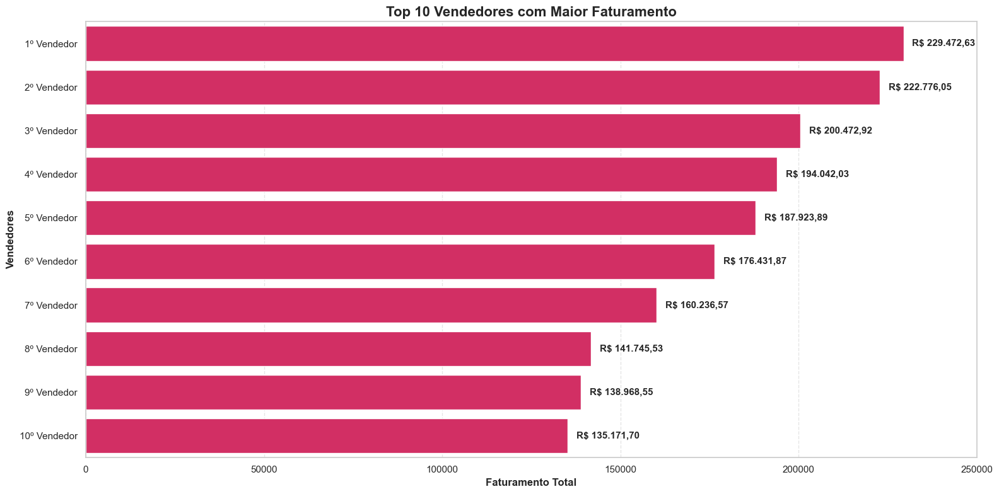

In [ ]:
top_10_sellers = ranking_vendedores.head(10).copy()
top_10_sellers = top_10_sellers.sort_values(by='faturamento_total', ascending=False)

plt.figure(figsize=(16, 8))
sns.barplot(data=top_10_sellers, x='faturamento_total', y='ranking_vendedor', color='#ED145B')
plt.title('Top 10 Vendedores com Maior Faturamento', fontsize=16, fontweight='bold')
plt.xlabel('Faturamento Total', fontsize=12, fontweight='bold')
plt.ylabel('Vendedores', fontsize=12, fontweight='bold')
plt.xlim(-0.5, 250000)
valores_formatados = [f"R$ {val:,.2f}".replace(",", "v").replace(".", ",").replace("v", ".") for val in plt.gca().containers[0].datavalues]
plt.bar_label(plt.gca().containers[0], labels=valores_formatados, padding=10, fontsize=11, fontweight='bold')
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()

plt.show()

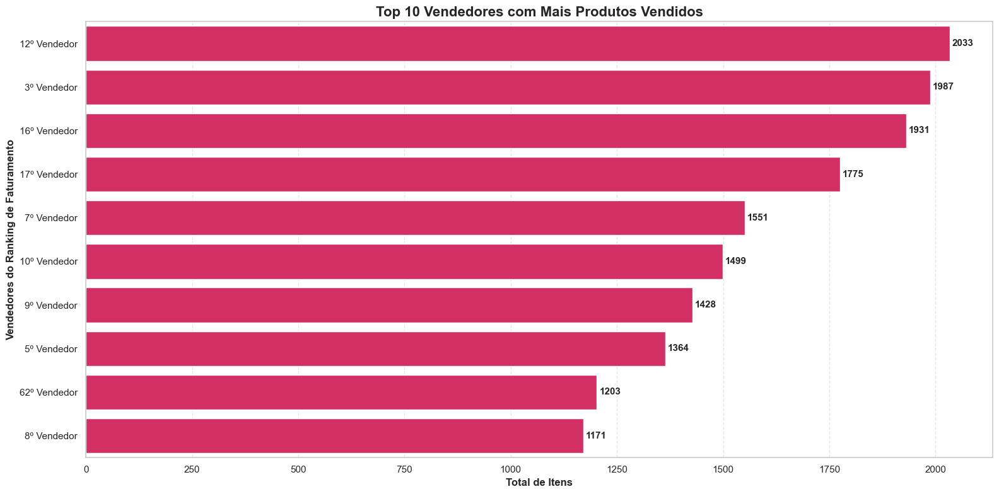

In [ ]:
ranking_vendedores = ranking_vendedores.sort_values(by='total_itens_vendidos', ascending=False)
top_10_sellers_qtd = ranking_vendedores.head(10).copy()
top_10_sellers_qtd = top_10_sellers_qtd.sort_values(by='total_itens_vendidos', ascending=False)

plt.figure(figsize=(16, 8))
sns.barplot(data=top_10_sellers_qtd, x='total_itens_vendidos', y='ranking_vendedor', color='#ED145B')
plt.title('Top 10 Vendedores com Mais Produtos Vendidos', fontsize=16, fontweight='bold')
plt.xlabel('Total de Itens', fontsize=12, fontweight='bold')
plt.ylabel('Vendedores do Ranking de Faturamento', fontsize=12, fontweight='bold')
plt.bar_label(plt.gca().containers[0], padding=3, fontsize=11, fontweight='bold')
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()

plt.show()

<p style="font-size:14px;">
 Analisando o dado (gráfico)
</p>

<p style="font-size:14px;">
 O resultado mais interessante dessa análise é observar que o vendedor líder em faturamento não está entre os dez vendedores com mais vendas, assim como outros três vendedores que não entraram no ranking de quantidade fazem parte do ranking de faturamento. Esse resultado se dá pelo produto e o seu ticket médio comercializado por cada vendedor, fazendo com que os itens de baixo custo precisem de um grande volume de vendas para se igualar ao faturamento da venda de poucos itens de alto custo. Já o 3º Vendedor tem um equilíbrio entre a quantidade de produtos e o ticket médio, fazendo com que esteja entre os três com mais vendas e maior faturamento. 
</p>


In [ ]:
ranking_vendedores = ranking_vendedores.sort_values(by='total_itens_vendidos', ascending=False)
top_10_sellers_qtd = ranking_vendedores.head(10).copy()
top_10_sellers_qtd = top_10_sellers_qtd.sort_values(by='total_itens_vendidos', ascending=False)

top_10_sellers_qtd

,seller_id,total_itens_vendidos,faturamento_total,ranking_vendedor
1235,6560211a19b47992c3666cc44a7e94c0,2033,123304.83,12º Vendedor
881,4a3ca9315b744ce9f8e9374361493884,1987,200472.92,3º Vendedor
368,1f50f920176fa81dab994f9023523100,1931,106939.21,16º Vendedor
2481,cc419e0650a3c5ba77189a1882b7556a,1775,104288.42,17º Vendedor
2643,da8622b14eb17ae2831f4ac5b9dab84a,1551,160236.57,7º Vendedor
1824,955fee9216a65b617aa5c0531780ce60,1499,135171.70,10º Vendedor
192,1025f0e2d44d7041d6cf58b6550e0bfa,1428,138968.55,9º Vendedor
1535,7c67e1448b00f6e969d365cea6b010ab,1364,187923.89,5º Vendedor
2836,ea8482cd71df3c1969d7b9473ff13abc,1203,37177.52,62º Vendedor
1505,7a67c85e85bb2ce8582c35f2203ad736,1171,141745.53,8º Vendedor


<p style="font-size:14px;">
 Vendedores com a informação do Estado/UF
</p>


In [ ]:
# Incluindo a informação da UF de cada vendedor
vendedores_uf = pd.merge(ranking_vendedores, df_sellers[['seller_id', 'estado']], on='seller_id', how='left')
vendedores_uf = vendedores_uf.sort_values(by='faturamento_total', ascending=False)

vendedores_uf.head(5)

,seller_id,total_itens_vendidos,faturamento_total,ranking_vendedor,estado
10,4869f7a5dfa277a7dca6462dcf3b52b2,1156,229472.63,1º Vendedor,SP
38,53243585a1d6dc2643021fd1853d8905,410,222776.05,2º Vendedor,BA
1,4a3ca9315b744ce9f8e9374361493884,1987,200472.92,3º Vendedor,SP
20,fa1c13f2614d7b5c4749cbc52fecda94,586,194042.03,4º Vendedor,SP
7,7c67e1448b00f6e969d365cea6b010ab,1364,187923.89,5º Vendedor,SP


In [ ]:
# Criando um TOP 10 Estados com mais vendas
TOPvendedores_uf = vendedores_uf.groupby('estado')['faturamento_total'].sum().reset_index()
TOPvendedores_uf = TOPvendedores_uf.sort_values(by='faturamento_total', ascending=False)

TOP10_vendedores_uf = TOPvendedores_uf.head(10)

TOP10_vendedores_uf

,estado,faturamento_total
22,SP,8753396.21
15,PR,1261887.21
8,MG,1011564.74
16,RJ,843984.22
20,SC,632426.07
19,RS,378559.54
2,BA,285561.56
4,DF,97749.48
13,PE,91493.85
6,GO,66399.21


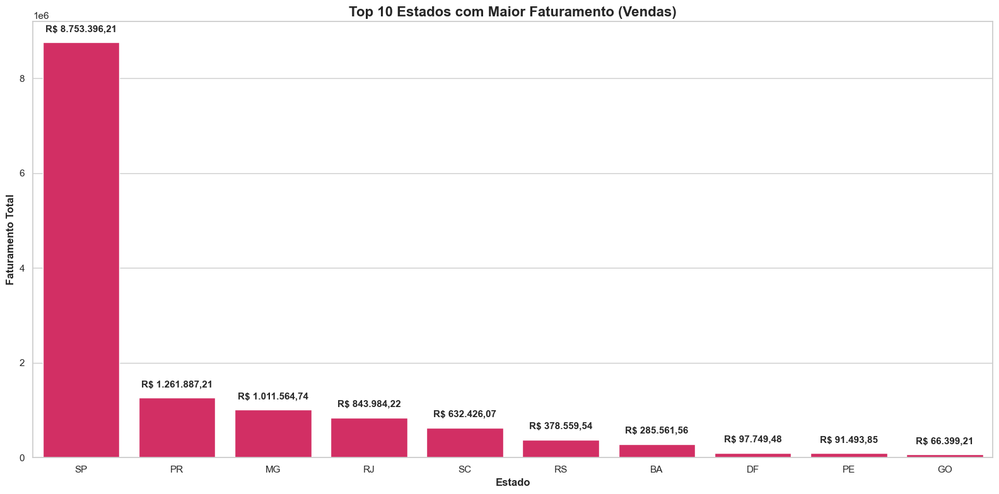

In [ ]:
TOP10_vendedores_uf = TOP10_vendedores_uf.sort_values(by='faturamento_total', ascending=False)

plt.figure(figsize=(16, 8))
sns.barplot(data=TOP10_vendedores_uf, x='estado', y='faturamento_total', color='#ED145B')
plt.title('Top 10 Estados com Maior Faturamento (Vendas)', fontsize=16, fontweight='bold')
plt.xlabel('Estado', fontsize=12, fontweight='bold')
plt.ylabel('Faturamento Total', fontsize=12, fontweight='bold')
valores_formatados = [f"R$ {val:,.2f}".replace(",", "v").replace(".", ",").replace("v", ".") for val in plt.gca().containers[0].datavalues]
plt.bar_label(plt.gca().containers[0], labels=valores_formatados, padding=10, fontsize=11, fontweight='bold')
plt.tight_layout()

plt.show()

<p style="font-size:14px;">
 Analisando o dado (gráfico)
</p>

<p style="font-size:14px;">
 Assim como líder em Estado com mais clientes/compradores, o Estado de São Paulo também se mantém como o maior na lista de faturamento (vendas). 
Pode-se considerar como um resultado de total a estrutura que o Estado dispõe, assim como grandes centros comerciais e indústrias.
</p>


<h1 style="color:#ED145B; font-family:'Segoe UI';">
2. Logística e SLA
</h1>

<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.1 Objetivo
</h1>

<p style="font-size:14px;">
Analisar o desempenho logístico do e-commerce da Olist por meio do acompanhamento do lead time entre compra, aprovação, postagem e entrega, investigando a relação entre atrasos operacionais e o nível de satisfação dos clientes. A análise busca identificar padrões regionais de desempenho e compreender como o cumprimento do SLA impacta a experiência do consumidor e a percepção de qualidade do serviço.
</p>

<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.2 Resumo
</h1>

<p style="font-size:14px;">
Nesta etapa do projeto, foi iniciada a análise de desempenho logístico utilizando Python no Jupyter Notebook. Inicialmente, foram importadas as bibliotecas pandas, matplotlib e seaborn, responsáveis pelo tratamento, análise e visualização dos dados. Em seguida, foram carregadas as bases relacionadas aos pedidos, avaliações de clientes e informações geográficas dos consumidores. O objetivo desta etapa é preparar os dados para mensurar indicadores logísticos como lead time de aprovação, postagem e entrega, além de identificar atrasos operacionais. A análise busca compreender como o desempenho do SLA impacta diretamente a satisfação dos clientes, utilizando métricas como review_score e mapas regionais de desempenho logístico.
</p>


<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.3 Qualidade e Consistência dos Dados:
</h1>

<p style="font-size:14px;">
Antes da construção dos indicadores logísticos, foi realizada uma etapa de validação da qualidade dos dados, com foco na identificação de valores nulos, registros inconsistentes e possíveis duplicidades nas chaves das tabelas..
</p>

In [ ]:
# Verificação de Valores Nulos
df_orders.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [ ]:
# Validação dos ID
df_orders['order_id'].duplicated().sum()

np.int64(0)

In [ ]:
# Validação dos Reviews
df_reviews['review_id'].duplicated().sum()

np.int64(814)

In [ ]:
# Validação dos Customers
df_customers['customer_id'].duplicated().sum()

np.int64(0)

In [ ]:
# Filtrando somente os pedidos entregues
orders_entregues = df_orders[df_orders['order_status'] == 'delivered'].copy()

<p style="font-size:14px;">
Resultado do tratamento do df
</p>

<p style="font-size:14px;">
A análise de qualidade dos dados identificou valores nulos em colunas relacionadas ao fluxo logístico dos pedidos, principalmente nas etapas de aprovação, envio e entrega. Esses registros estão associados, em sua maioria, a pedidos cancelados ou não concluídos. Em relação à integridade das chaves primárias, as tabelas de pedidos e clientes não apresentaram duplicidades. Entretanto, a tabela de avaliações apresentou registros duplicados no campo review_id, indicando possíveis reutilizações de avaliações ou inconsistências no processo de coleta dos reviews.
</p>

<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.4 Conversão de Datas
</h1>

<p style="font-size:14px;">
Nesta etapa, as colunas temporais foram convertidas para o formato datetime, permitindo o cálculo dos indicadores logísticos relacionados ao SLA e lead time dos pedidos.
</p>


In [ ]:
# Convertendo as colunas de datas do dataframe para o formato datetime, permitindo realizar cálculos de tempo entre datas.
colunas_datas = ['order_purchase_timestamp','order_approved_at','order_delivered_carrier_date','order_delivered_customer_date','order_estimated_delivery_date']
for coluna in colunas_datas:
    orders_entregues[coluna] = pd.to_datetime(orders_entregues[coluna])

# Visualizando os tipos de dados das colunas após a conversão para datetime.
orders_entregues[colunas_datas].dtypes       


order_purchase_timestamp         datetime64[us]
order_approved_at                datetime64[us]
order_delivered_carrier_date     datetime64[us]
order_delivered_customer_date    datetime64[us]
order_estimated_delivery_date    datetime64[us]
dtype: object

| Coluna | Significado |
|---|---|
| order_purchase_timestamp | data da compra |
| order_approved_at | aprovação do pagamento |
| order_delivered_carrier_date | envio para transportadora |
| order_delivered_customer_date | entrega ao cliente |
| order_estimated_delivery_date | prazo estimado |

<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.5 Tempo entre a realização da compra e a aprovação
</h1>

<p style="font-size:14px;">
O indicador mede o intervalo entre a realização da compra e a aprovação do pagamento do pedido.
</p>


In [ ]:
# Calculando o tempo entre a realização da compra e a aprovação do pagamento do pedido em horas.
orders_entregues['tempo_aprovacao'] = (orders_entregues['order_approved_at'] - orders_entregues['order_purchase_timestamp']).dt.total_seconds() / 3600

# Visualizando os primeiros registros do tempo de aprovação dos pedidos.
orders_entregues[['order_purchase_timestamp','order_approved_at','tempo_aprovacao']]


,order_purchase_timestamp,order_approved_at,tempo_aprovacao
0,2017-10-02 10:56:33,2017-10-02 11:07:15,0.178333
1,2018-07-24 20:41:37,2018-07-26 03:24:27,30.713889
2,2018-08-08 08:38:49,2018-08-08 08:55:23,0.276111
3,2017-11-18 19:28:06,2017-11-18 19:45:59,0.298056
4,2018-02-13 21:18:39,2018-02-13 22:20:29,1.030556
...,...,...,...
99436,2017-03-09 09:54:05,2017-03-09 09:54:05,0.000000
99437,2018-02-06 12:58:58,2018-02-06 13:10:37,0.194167
99438,2017-08-27 14:46:43,2017-08-27 15:04:16,0.292500
99439,2018-01-08 21:28:27,2018-01-08 21:36:21,0.131667


<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.6 Tempo entre realização da compra e a aprovação do pagamento
</h1>

<p style="font-size:14px;">
O indicador mede o intervalo entre a realização da compra e a aprovação do pagamento do pedido.
</p>


In [ ]:
# Calculando o tempo entre a realização da compra e a aprovação do pagamento do pedido.
orders_entregues['tempo_aprovacao'] = (orders_entregues['order_approved_at'] - orders_entregues['order_purchase_timestamp']).dt.days

# Visualizando os primeiros registros do tempo de aprovação dos pedidos.
orders_entregues[['order_purchase_timestamp','order_approved_at','tempo_aprovacao']]

,order_purchase_timestamp,order_approved_at,tempo_aprovacao
0,2017-10-02 10:56:33,2017-10-02 11:07:15,0.0
1,2018-07-24 20:41:37,2018-07-26 03:24:27,1.0
2,2018-08-08 08:38:49,2018-08-08 08:55:23,0.0
3,2017-11-18 19:28:06,2017-11-18 19:45:59,0.0
4,2018-02-13 21:18:39,2018-02-13 22:20:29,0.0
...,...,...,...
99436,2017-03-09 09:54:05,2017-03-09 09:54:05,0.0
99437,2018-02-06 12:58:58,2018-02-06 13:10:37,0.0
99438,2017-08-27 14:46:43,2017-08-27 15:04:16,0.0
99439,2018-01-08 21:28:27,2018-01-08 21:36:21,0.0


<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.7 Tempo de Postagem
</h1>

<p style="font-size:14px;">
O tempo de postagem representa o intervalo entre a aprovação do pagamento e o envio do pedido para a transportadora.
</p>


In [ ]:
# Calculando o tempo entre a aprovação do pagamento e o envio do pedido para a transportadora.
orders_entregues['tempo_postagem_horas'] = (orders_entregues['order_delivered_carrier_date'] - orders_entregues['order_approved_at']).dt.total_seconds() / 3600

# Visualizando os primeiros registros do tempo de postagem dos pedidos.
orders_entregues[['order_approved_at','order_delivered_carrier_date','tempo_postagem_horas']]

,order_approved_at,order_delivered_carrier_date,tempo_postagem_horas
0,2017-10-02 11:07:15,2017-10-04 19:55:00,56.795833
1,2018-07-26 03:24:27,2018-07-26 14:31:00,11.109167
2,2018-08-08 08:55:23,2018-08-08 13:50:00,4.910278
3,2017-11-18 19:45:59,2017-11-22 13:39:59,89.900000
4,2018-02-13 22:20:29,2018-02-14 19:46:34,21.434722
...,...,...,...
99436,2017-03-09 09:54:05,2017-03-10 11:18:03,25.399444
99437,2018-02-06 13:10:37,2018-02-07 23:22:42,34.201389
99438,2017-08-27 15:04:16,2017-08-28 20:52:26,29.802778
99439,2018-01-08 21:36:21,2018-01-12 15:35:03,89.978333


<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.8 Tempo de Entrega
</h1>

<p style="font-size:14px;">
O lead time de entrega mede o tempo total entre a compra realizada pelo cliente e a entrega final do pedido.
</p>


In [ ]:
# Calculando o tempo entre o envio do pedido para a transportadora e a entrega final ao cliente.
orders_entregues['tempo_transporte_entrega'] = (orders_entregues['order_delivered_customer_date'] - orders_entregues['order_delivered_carrier_date']).dt.days

# Visualizando os primeiros registros do tempo de transporte e entrega dos pedidos.
orders_entregues[['order_delivered_carrier_date','order_delivered_customer_date','tempo_transporte_entrega']]

,order_delivered_carrier_date,order_delivered_customer_date,tempo_transporte_entrega
0,2017-10-04 19:55:00,2017-10-10 21:25:13,6.0
1,2018-07-26 14:31:00,2018-08-07 15:27:45,12.0
2,2018-08-08 13:50:00,2018-08-17 18:06:29,9.0
3,2017-11-22 13:39:59,2017-12-02 00:28:42,9.0
4,2018-02-14 19:46:34,2018-02-16 18:17:02,1.0
...,...,...,...
99436,2017-03-10 11:18:03,2017-03-17 15:08:01,7.0
99437,2018-02-07 23:22:42,2018-02-28 17:37:56,20.0
99438,2017-08-28 20:52:26,2017-09-21 11:24:17,23.0
99439,2018-01-12 15:35:03,2018-01-25 23:32:54,13.0


<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.9 Atraso de Entrega
</h1>

<p style="font-size:14px;">
O indicador de atraso mede a diferença entre a data real de entrega e a data estimada informada ao cliente.
</span>
</p>

In [ ]:
# Calculando o atraso da entrega em dias
orders_entregues['atraso_entrega'] = (orders_entregues['order_delivered_customer_date'] - orders_entregues['order_estimated_delivery_date']).dt.days

# Visualizando os primeiros resultados
orders_entregues[['order_delivered_customer_date','order_estimated_delivery_date','atraso_entrega']]


,order_delivered_customer_date,order_estimated_delivery_date,atraso_entrega
0,2017-10-10 21:25:13,2017-10-18,-8.0
1,2018-08-07 15:27:45,2018-08-13,-6.0
2,2018-08-17 18:06:29,2018-09-04,-18.0
3,2017-12-02 00:28:42,2017-12-15,-13.0
4,2018-02-16 18:17:02,2018-02-26,-10.0
...,...,...,...
99436,2017-03-17 15:08:01,2017-03-28,-11.0
99437,2018-02-28 17:37:56,2018-03-02,-2.0
99438,2017-09-21 11:24:17,2017-09-27,-6.0
99439,2018-01-25 23:32:54,2018-02-15,-21.0


| Valor    | Significado        |
| -------- | ------------------ |
| negativo | entrega antecipada |
| zero     | entrega no prazo   |
| positivo | entrega atrasada   |


In [ ]:
orders_entregues[
    [
        'tempo_aprovacao',
        'tempo_postagem_horas',
        'tempo_transporte_entrega',
        'atraso_entrega'
    ]
].head()

,tempo_aprovacao,tempo_postagem_horas,tempo_transporte_entrega,atraso_entrega
0,0.0,56.795833,6.0,-8.0
1,1.0,11.109167,12.0,-6.0
2,0.0,4.910278,9.0,-18.0
3,0.0,89.900000,9.0,-13.0
4,0.0,21.434722,1.0,-10.0


<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.10 Estatísticas Descritivas das Métricas Logísticas
</h1>

<p style="font-size:14px;">
A análise estatística permite compreender o comportamento médio dos indicadores logísticos, além da dispersão dos tempos de entrega e dos atrasos operacionais.

</p>

In [ ]:
# Gerando estatísticas descritivas dos principais indicadores logísticos calculados durante a análise.
orders_entregues[['tempo_aprovacao','tempo_postagem_horas','tempo_transporte_entrega','atraso_entrega']].describe()

,tempo_aprovacao,tempo_postagem_horas,tempo_transporte_entrega,atraso_entrega
count,96464.000000,96462.000000,96469.000000,96470.000000
mean,0.264337,67.177826,8.878054,-11.875889
std,0.729926,84.889850,8.745881,10.182105
min,0.000000,-4109.256111,-17.000000,-147.000000
25%,0.000000,20.984722,4.000000,-17.000000
50%,0.000000,43.580278,7.000000,-12.000000
75%,0.000000,85.800208,12.000000,-7.000000
max,30.000000,3018.301667,205.000000,188.000000


<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.11 Lead Time entre Compra e Aprovação
</h1>


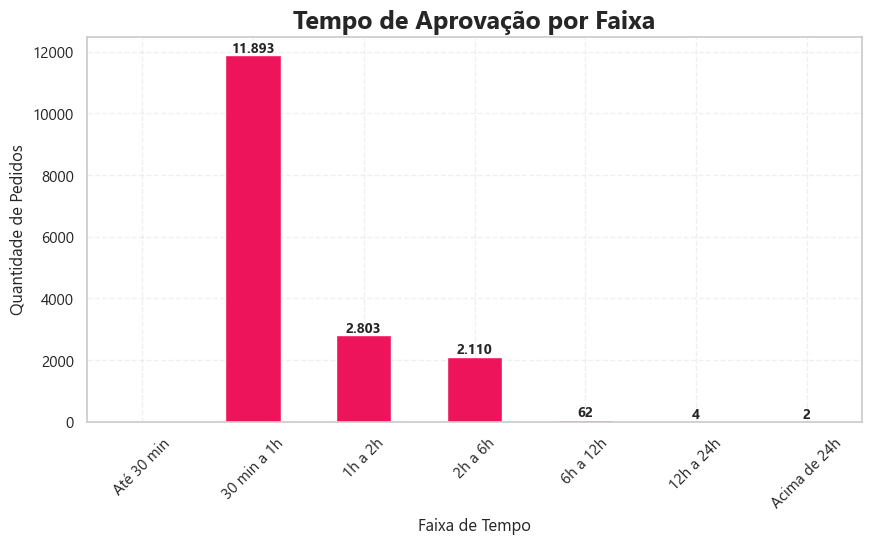

In [ ]:
# Crinado faixa para o grafico
bins = [
    0.25,
    0.5,
    1,
    2,
    6,
    12,
    24,
    1000
]

labels = [
    'Até 30 min',
    '30 min a 1h',
    '1h a 2h',
    '2h a 6h',
    '6h a 12h',
    '12h a 24h',
    'Acima de 24h'
]

# Categria 
orders_entregues['faixa_aprovacao'] = pd.cut(orders_entregues['tempo_aprovacao'],bins=bins,labels=labels)

# Contagem
faixa_counts = (orders_entregues['faixa_aprovacao'].value_counts().sort_index())

# Grafico
plt.figure(figsize=(10,5))
ax = faixa_counts.plot(kind='bar',color='#ED145B')

# titulos
plt.title('Tempo de Aprovação por Faixa',fontsize=18,fontweight='bold',fontname='Segoe UI')
plt.xlabel('Faixa de Tempo',fontsize=12,fontname='Segoe UI')
plt.ylabel('Quantidade de Pedidos',fontsize=12,fontname='Segoe UI')

# Grid
plt.grid(True,linestyle='--',alpha=0.3)

#adicionado fonte nos eixos
plt.xticks(rotation=45,fontname='Segoe UI')
plt.yticks(fontname='Segoe UI')

# Exibindo valores nas barras
for i, valor in enumerate(faixa_counts):
    if valor > 0:
        ax.text(i,valor + 100,f'{valor:,.0f}'.replace(',', '.'),ha='center',fontsize=10,fontweight='bold',fontname='Segoe UI')

# Exibindo grafico
plt.show()

<p style="font-size:14px;">
 Análise do grafico
</p>

<p style="font-size:14px;">
 A análise dos indicadores logísticos permitiu identificar padrões relevantes no desempenho operacional. Os resultados demonstram que o processo de aprovação financeira apresenta elevada eficiência, com maior concentração de pedidos aprovados entre 30 minutos e 1 hora após a compra.
</p>

<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.12 Lead Time entre Aprovação e Postagem
</h1>

<p style="font-size:14px;">
O lead time entre aprovação e postagem representa o intervalo entre a confirmação do pagamento e o envio do pedido para a transportadora. Esse indicador permite avaliar a agilidade operacional do processo de separação e expedição dos pedidos.
</p>

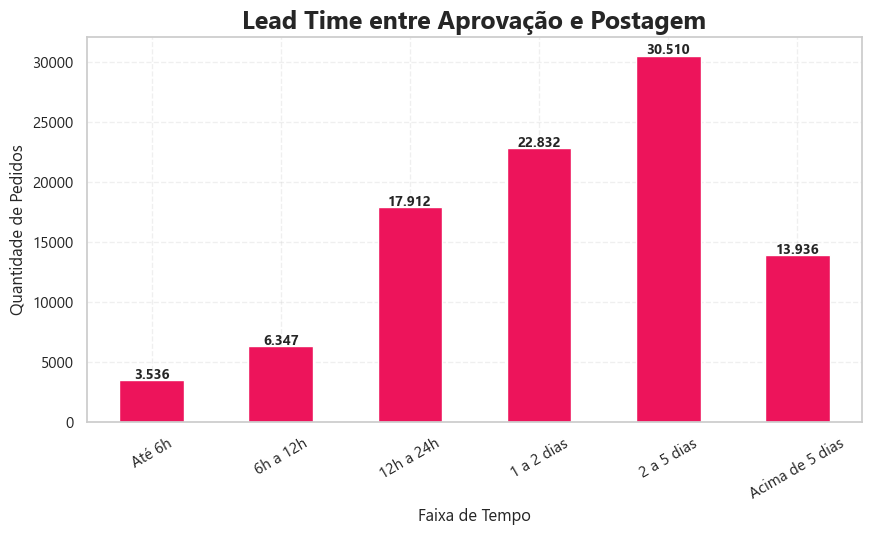

In [ ]:
# Crinado faixa para o grafico
bins = [
    0,
    6,
    12,
    24,
    48,
    120,
    1000
]

labels = [
    'Até 6h',
    '6h a 12h',
    '12h a 24h',
    '1 a 2 dias',
    '2 a 5 dias',
    'Acima de 5 dias'
]

# Categria
orders_entregues['faixa_postagem'] = pd.cut(orders_entregues['tempo_postagem_horas'],bins=bins,labels=labels)

# Contagem
faixa_counts = (orders_entregues['faixa_postagem'].value_counts().sort_index())

# Grafico 
plt.figure(figsize=(10,5))

ax = faixa_counts.plot(kind='bar',color='#ED145B')

# Título
plt.title('Lead Time entre Aprovação e Postagem',fontsize=18,fontweight='bold',fontname='Segoe UI')

# Eixos
plt.xlabel('Faixa de Tempo',fontsize=12,fontname='Segoe UI')
plt.ylabel('Quantidade de Pedidos',fontsize=12,fontname='Segoe UI')

# Grid
plt.grid(True,linestyle='--',alpha=0.3)

# Fonte dos eixos
plt.xticks(rotation=30,fontname='Segoe UI')
plt.yticks(fontname='Segoe UI')

# Valores nas barras
for i, valor in enumerate(faixa_counts):
    if valor > 0:ax.text(i,valor + 100,f'{valor:,.0f}'.replace(',', '.'),ha='center',fontsize=10,fontweight='bold',fontname='Segoe UI')


plt.show()

<p style="font-size:14px;">
 Análise
</p>

<p style="font-size:14px;">
 A análise do lead time entre aprovação e postagem demonstra que o processo de expedição dos pedidos apresenta maior concentração entre 1 e 5 dias após a confirmação do pagamento, com destaque para a faixa de 2 a 5 dias, que representa o maior volume operacional da plataforma. Os resultados indicam que, embora existam pedidos enviados em menos de 24 horas, a operação logística possui predominância de ciclos de postagem mais extensos. 
</p>


<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.13 Lead Time de Transporte e Entrega
</h1>

<p style="font-size:14px;">
O lead time de transporte e entrega representa o intervalo entre o envio do pedido para a transportadora e a entrega final ao cliente. Esse indicador permite avaliar a eficiência da etapa de distribuição logística, estando diretamente relacionado ao cumprimento do SLA e à experiência do consumidor. A análise desse indicador possibilita identificar padrões de desempenho das transportadoras, estabilidade operacional e possíveis gargalos no processo de entrega.
</p>

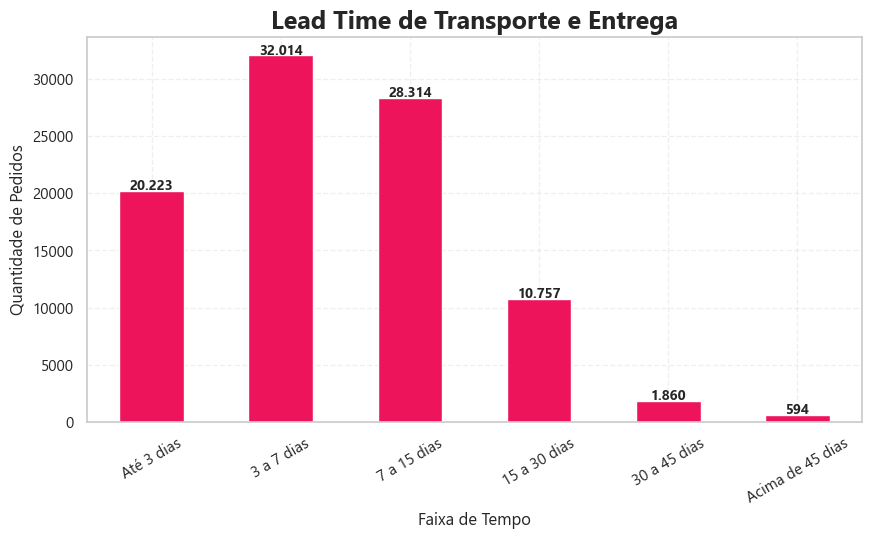

In [ ]:
# Crinado faixa para o grafico
bins = [
    0,
    3,
    7,
    15,
    30,
    45,
    1000
]

labels = [
    'Até 3 dias',
    '3 a 7 dias',
    '7 a 15 dias',
    '15 a 30 dias',
    '30 a 45 dias',
    'Acima de 45 dias'
]

# Categria
orders_entregues['faixa_transporte'] = pd.cut(orders_entregues['tempo_transporte_entrega'],bins=bins,labels=labels)

# Contagem
faixa_counts = (orders_entregues['faixa_transporte'].value_counts().sort_index())

# Grafico 
plt.figure(figsize=(10,5))
ax = faixa_counts.plot(kind='bar',color='#ED145B')

# Título
plt.title('Lead Time de Transporte e Entrega',fontsize=18,fontweight='bold',fontname='Segoe UI')

# Eixos
plt.xlabel('Faixa de Tempo',fontsize=12,fontname='Segoe UI')
plt.ylabel('Quantidade de Pedidos',fontsize=12,fontname='Segoe UI')

# Grid
plt.grid(True,linestyle='--',alpha=0.3)

# Fonte dos eixos
plt.xticks(rotation=30,fontname='Segoe UI')
plt.yticks(fontname='Segoe UI')

# Valores nas barras
for i, valor in enumerate(faixa_counts):

    if valor > 0:ax.text(i,valor + 100,f'{valor:,.0f}'.replace(',', '.'),ha='center',fontsize=10,fontweight='bold',fontname='Segoe UI' )

plt.show()

<p style="font-size:14px;">
 Análise
</p>

<p style="font-size:14px;">
 A análise do lead time entre expedição e entrega demonstra que a maior parte dos pedidos foi entregue entre 3 e 15 dias após o envio para a transportadora, com maior concentração nas faixas de 3 a 7 dias e 7 a 15 dias. Os resultados indicam relativa estabilidade operacional no processo logístico de distribuição, evidenciando que a maioria das entregas ocorre dentro de um prazo considerado adequado para operações de e-commerce em escala nacional.
</p>

<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.14 Correlação entre Atrasos e Avaliação dos Clientes
</h1>

<p style="font-size:14px;">
Nesta etapa, foi analisada a relação entre o atraso na entrega dos pedidos e a avaliação realizada pelos clientes por meio do review_score. O objetivo é identificar como o desempenho logístico influencia diretamente a satisfação do consumidor e a percepção de qualidade do serviço.
</p>

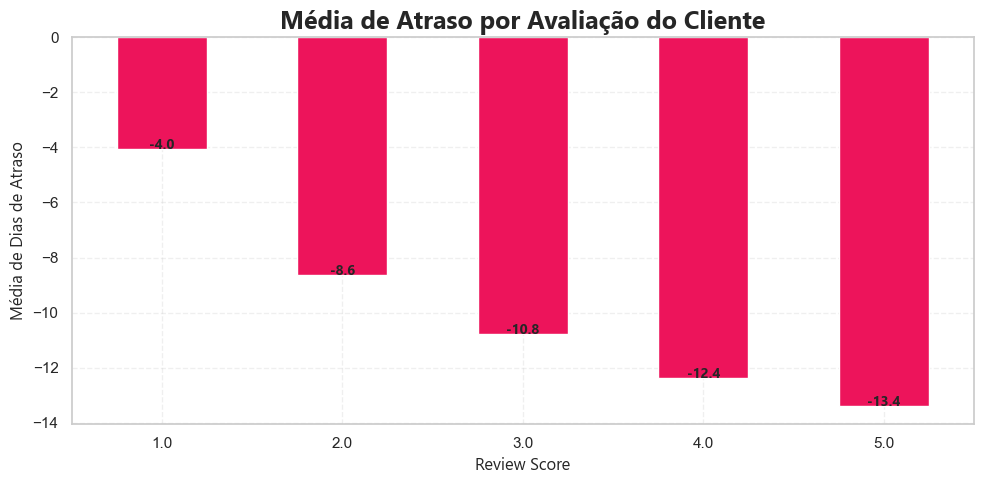

In [ ]:
# Realizando merge
df_reviews = orders_entregues.merge(df_reviews[['order_id','review_score']],on='order_id',how='left')

# Agrupando os pedidos pela nota de avaliação e calculando a média do atraso de entrega para cada nota
media_review = (df_reviews.groupby('review_score')['atraso_entrega'].mean())

plt.figure(figsize=(10,5))

ax = media_review.plot(kind='bar',color='#ED145B')

# Título
plt.title('Média de Atraso por Avaliação do Cliente',fontsize=18,fontweight='bold',fontname='Segoe UI')

# Eixos
plt.xlabel('Review Score',fontsize=12,fontname='Segoe UI')
plt.ylabel('Média de Dias de Atraso',fontsize=12,fontname='Segoe UI')

# Grid
plt.grid(True,linestyle='--',alpha=0.3)

# Valores nas barras
for i, valor in enumerate(media_review):

    ax.text(i,valor,f'{valor:.1f}',ha='center',fontsize=10,fontweight='bold',fontname='Segoe UI')

# Fonte dos eixos
plt.xticks(rotation=0)
plt.tight_layout()

plt.show()

<p style="font-size:14px;">
 Análise
</p>

<p style="font-size:14px;">
 A análise da relação entre atraso de entrega e avaliação dos clientes demonstra que pedidos associados a maiores níveis de satisfação tendem a apresentar entregas realizadas com maior antecedência em relação ao prazo estimado. Clientes que atribuíram nota 5 apresentaram média de entrega aproximadamente 13 dias antes do prazo previsto, enquanto avaliações mais baixas estiveram associadas a menor antecedência nas entregas. Os resultados reforçam a influência do desempenho logístico sobre a percepção de qualidade do serviço, evidenciando que entregas rápidas e antecipadas contribuem positivamente para a experiência do consumidor. 
</p>



<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.15 Mapa de Calor de Desempenho por Região
</h1>

<p style="font-size:14px;">
Nesta etapa, foi analisado o desempenho logístico por região geográfica, considerando o percentual de pedidos entregues com atraso em cada estado brasileiro. O objetivo da análise é identificar padrões regionais no cumprimento do SLA logístico, destacando áreas com maior incidência de atrasos operacionais e possíveis diferenças de eficiência na distribuição das entregas.
</p>

In [ ]:
df_customers.columns.tolist()

['customer_id',
 'customer_unique_id',
 'customer_zip_code_prefix',
 'cidade',
 'estado']

In [ ]:
# Merge
df_regiao = (orders_entregues.merge(df_customers[['customer_id', 'estado']].rename(columns={'estado': 'customer_state'}),on='customer_id',how='left'))

# Crindo indicadores
# Pedido atrasado = True
# Pedido no prazo/adiantado = False
df_regiao['pedido_atrasado'] = (df_regiao['atraso_entrega'] > 0)

# Calculando a porcentagem de atraso por estado
mapa_atraso = (df_regiao.groupby('customer_state')['pedido_atrasado'].mean().reset_index())

# Convertendo para porcentage
mapa_atraso['percentual_atraso'] = (mapa_atraso['pedido_atrasado'] * 100)

# Renomeando a coluna
mapa_atraso = mapa_atraso.rename(columns={'customer_state': 'UF'})

# Texto do hover, mostra o percentual quando passa o mouse
mapa_atraso['Percentual'] = (mapa_atraso['percentual_atraso'].round(1).astype(str) + '%')

# Carregando mapa GeoJason
url = "https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brazil-states.geojson"

with urlopen(url) as response:
    brasil = json.load(response)

# Criando mapa
fig = px.choropleth(mapa_atraso,geojson=brasil,locations='UF',featureidkey='properties.sigla',color='percentual_atraso',color_continuous_scale='Reds',projection='mercator',hover_name='UF',hover_data={
        'Percentual': True,'UF': False,'percentual_atraso': False},title='Taxa de Atraso Logístico por Estado')

# Ajustes visuais 
fig.update_geos(fitbounds="locations",visible=False)
fig.update_layout(title_font_size=22,width=1200,height=700,coloraxis_colorbar=dict(title='% Atraso'))


fig.show()

<p style="font-size:14px;">
 Análise
</p>

<p style="font-size:14px;">
 A análise regional do desempenho logístico demonstra diferenças no percentual de pedidos entregues com atraso entre os estados brasileiros. Estados das regiões Norte e Nordeste apresentaram maiores taxas de atraso logístico, indicando possíveis impactos relacionados à distância geográfica, infraestrutura de transporte e complexidade operacional da distribuição. Por outro lado, estados das regiões Sul, Sudeste e parte do Centro-Oeste apresentaram menores índices de atraso, evidenciando maior estabilidade operacional e melhor desempenho no cumprimento do SLA de entrega.
</p>

<h1 style="color:#ED145B; font-family:'Segoe UI';">
2.16 Conclusão 
</h1>

<p style="font-size:14px;">
A análise dos indicadores logísticos permitiu compreender o comportamento operacional do processo de aprovação, postagem e entrega dos pedidos, além de identificar a relação entre desempenho logístico e satisfação dos clientes. Os resultados demonstraram que grande parte dos pedidos é entregue antes do prazo estimado, evidenciando eficiência operacional no cumprimento do SLA. Os indicadores de lead time apontaram maior concentração das entregas entre 3 e 15 dias após a expedição, indicando estabilidade no processo logístico de distribuição.
A análise regional revelou diferenças no nível de antecipação das entregas entre os estados brasileiros, sugerindo influência da localização geográfica e da complexidade logística sobre o desempenho operacional. Ainda assim, a operação apresentou comportamento consistente em grande parte do território nacional. Em relação à experiência do cliente, foi possível observar que entregas realizadas com maior antecedência tendem a estar associadas a avaliações mais positivas no review_score, reforçando a importância da logística como fator estratégico para a satisfação do consumidor. Por fim, os resultados demonstram que o monitoramento contínuo dos indicadores de SLA, lead time e desempenho regional é fundamental para apoiar decisões operacionais, identificar oportunidades de melhoria e fortalecer a experiência do cliente no ambiente de e-commerce.
</p>

 <span style="color:#ED145B; font-size:24px; font-weight:bold; font-family:'Segoe UI';">

</span>
<h1 style="color:#ED145B; font-family:'Segoe UI';">
3. Comportamento e Pagamentos
</h1>

<p style="font-size:14px;">
O presente estudo tem como objetivo analisar o comportamento de compra e os padrões de pagamento dos clientes de um marketplace, utilizando dados referentes a pedidos, clientes, itens vendidos e transações financeiras. A análise busca transformar dados operacionais em informações estratégicas capazes de apoiar a tomada de decisão e a melhoria dos resultados do negócio.
Inicialmente, foi realizado o tratamento e a preparação dos dados, incluindo a remoção de registros duplicados e valores ausentes, garantindo maior confiabilidade para as análises subsequentes. Em seguida, foram avaliados indicadores relacionados aos meios de pagamento utilizados, ao faturamento gerado e ao comportamento de consumo dos clientes. 
Além disso, foram aplicadas métricas de RFM (Recência, Frequência e Valor Monetário), permitindo identificar perfis de clientes, padrões de fidelização e oportunidades de retenção. Por fim, foram exploradas possibilidades de análises preditivas e sistemas de recomendação, demonstrando como a utilização de dados pode contribuir para o aumento das vendas, a personalização da experiência do cliente e a otimização das estratégias comerciais.
</p>


<p style="font-size:14px;">
 Tratamento Inicial
</p>


In [ ]:
#Linhas e Colunas
print(f'Linhas e Colunas da tabela Pagamento: {df_payments.shape}')
print(f'Linhas e Colunas da tabela Pedidos: {df_orders.shape}')
print(f'Linhas e Colunas da tabela Clientes: {df_customers.shape}')
print(f'Linhas e Colunas da tabela Itens do pedido: {df_order_items.shape}')

Linhas e Colunas da tabela Pagamento: (103886, 5)
Linhas e Colunas da tabela Pedidos: (99441, 8)
Linhas e Colunas da tabela Clientes: (99441, 5)
Linhas e Colunas da tabela Itens do pedido: (112650, 7)


In [ ]:
#Remoção de Duplicatas
df_payments.drop_duplicates(inplace=True)
df_orders.drop_duplicates(inplace=True)
df_customers.drop_duplicates(inplace=True)
df_order_items.drop_duplicates(inplace=True)

In [ ]:
#Excluir linhas vazias
df_payments.dropna(inplace=True)
df_orders.dropna(inplace=True)
df_customers.dropna(inplace=True)
df_order_items.dropna(inplace=True)

In [ ]:
#Contar as Linhas e Colunas novamente para verificar se houve alteração
print(f'Linhas e Colunas da tabela Pagamento: {df_payments.shape}')
print(f'Linhas e Colunas da tabela Pedidos: {df_orders.shape}')
print(f'Linhas e Colunas da tabela Clientes: {df_customers.shape}')
print(f'Linhas e Colunas da tabela Itens do pedido: {df_order_items.shape}')

Linhas e Colunas da tabela Pagamento: (103886, 5)
Linhas e Colunas da tabela Pedidos: (96461, 8)
Linhas e Colunas da tabela Clientes: (99441, 5)
Linhas e Colunas da tabela Itens do pedido: (112650, 7)


In [ ]:
df_payments.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [ ]:
df_orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26


In [ ]:
df_payments.groupby('payment_type')['payment_value'].max()

payment_type
boleto          7274.88
credit_card    13664.08
debit_card      4445.50
not_defined        0.00
voucher         3184.34
Name: payment_value, dtype: float64

<h1 style="color:#ED145B; font-family:'Segoe UI';">
3.1 Pagamentos
</h1>

C:\Users\Fabio Kato\AppData\Local\Temp\ipykernel_1620\3448703658.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='payment_type', y='qtd_transacoes', data=relatorio_pagamentos, ax=axes[0], palette='Blues_r')
C:\Users\Fabio Kato\AppData\Local\Temp\ipykernel_1620\3448703658.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='payment_type', y='valor_medio', data=relatorio_pagamentos, ax=axes[1], palette='Greens_r')
C:\Users\Fabio Kato\AppData\Local\Temp\ipykernel_1620\3448703658.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='

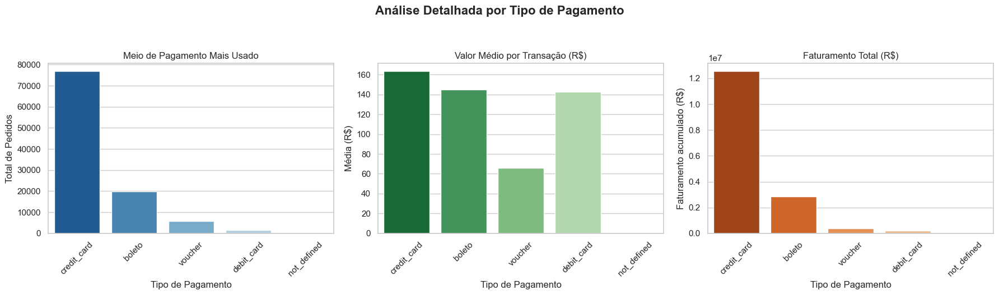

In [ ]:
# 1. Agrupamento
relatorio_pagamentos = df_payments.groupby('payment_type')['payment_value'].agg(
    qtd_transacoes='count',
    valor_medio='mean',
    faturamento_total='sum'
).sort_values(by='qtd_transacoes', ascending=False).reset_index() # .reset_index() ajuda na plotagem

# 2. Configurar a estrutura dos gráficos (1 linha e 3 colunas)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Análise Detalhada por Tipo de Pagamento', fontsize=16, fontweight='bold', y=1.05)

# Gráfico 1: Quantidade de Transações
sns.barplot(x='payment_type', y='qtd_transacoes', data=relatorio_pagamentos, ax=axes[0], palette='Blues_r')
axes[0].set_title('Meio de Pagamento Mais Usado')
axes[0].set_xlabel('Tipo de Pagamento')
axes[0].set_ylabel('Total de Pedidos')
axes[0].tick_params(axis='x', rotation=45)

# Gráfico 2: Valor Médio por Transação
sns.barplot(x='payment_type', y='valor_medio', data=relatorio_pagamentos, ax=axes[1], palette='Greens_r')
axes[1].set_title('Valor Médio por Transação (R$)')
axes[1].set_xlabel('Tipo de Pagamento')
axes[1].set_ylabel('Média (R$)')
axes[1].tick_params(axis='x', rotation=45)

# Gráfico 3: Faturamento Total
sns.barplot(x='payment_type', y='faturamento_total', data=relatorio_pagamentos, ax=axes[2], palette='Oranges_r')
axes[2].set_title('Faturamento Total (R$)')
axes[2].set_xlabel('Tipo de Pagamento')
axes[2].set_ylabel('Faturamento acumulado (R$)')
axes[2].tick_params(axis='x', rotation=45)

# Ajustar o espaçamento para os nomes não cortarem
plt.tight_layout()

# Exibir o gráfico
plt.show()

<h1 style="color:#ED145B; font-family:'Segoe UI';">
3.2 Indicadores de RFM
</h1>

<p style="font-size:14px;">
 Quando foi a última compra?
</p>

In [ ]:
# 1. Junta a tabela de pedidos com a de clientes para ter o 'customer_unique_id'
df_compras = pd.merge(df_orders, df_customers, on='customer_id', how='inner')

# 2. Garante que a coluna de data está no formato correto de data (datetime)
df_compras['order_purchase_timestamp'] = pd.to_datetime(df_compras['order_purchase_timestamp'])

# 3. Agrupa por cliente único e pega a maior data (a mais recente)
df_ultima_compra = df_compras.groupby('customer_unique_id')['order_purchase_timestamp'].max().reset_index()

# 4. Renomeia as colunas para o relatório ficar limpo
df_ultima_compra.columns = ['customer_unique_id', 'data_ultima_compra']

# Visualizar o resultado
print(df_ultima_compra.head())

                 customer_unique_id  data_ultima_compra
0  0000366f3b9a7992bf8c76cfdf3221e2 2018-05-10 10:56:27
1  0000b849f77a49e4a4ce2b2a4ca5be3f 2018-05-07 11:11:27
2  0000f46a3911fa3c0805444483337064 2017-03-10 21:05:03
3  0000f6ccb0745a6a4b88665a16c9f078 2017-10-12 20:29:41
4  0004aac84e0df4da2b147fca70cf8255 2017-11-14 19:45:42


<p style="font-size:14px;">
 Frequência: Quantas vezes comprou?
</p>

In [ ]:
# 1. Conta direto quantas vezes cada cliente único aparece
df_frequencia = df_compras['customer_unique_id'].value_counts().reset_index()

# 2. Renomeia as colunas para ficar organizado
df_frequencia.columns = ['customer_unique_id', 'frequencia']

# Visualizar o resultado
print(df_frequencia.head())

                 customer_unique_id  frequencia
0  8d50f5eadf50201ccdcedfb9e2ac8455          15
1  3e43e6105506432c953e165fb2acf44c           9
2  ca77025e7201e3b30c44b472ff346268           7
3  1b6c7548a2a1f9037c1fd3ddfed95f33           7
4  6469f99c1f9dfae7733b25662e7f1782           7


<p style="font-size:14px;">
 Monetização: Quanto gastou no total?
</p>

In [ ]:
# 1. Cruzar as tabelas para unir o Cliente Único ao valor do Pagamento
df_valores = pd.merge(df_orders, df_customers, on='customer_id', how='inner')
df_valores = pd.merge(df_valores, df_payments, on='order_id', how='inner')

# 2. Agrupar por cliente e somar o valor gasto (payment_value)
df_monetizacao = df_valores.groupby('customer_unique_id').agg(
    monetizacao=('payment_value', 'sum')
).reset_index()

# Visualizar o resultado
print(df_monetizacao.head())

                 customer_unique_id  monetizacao
0  0000366f3b9a7992bf8c76cfdf3221e2       141.90
1  0000b849f77a49e4a4ce2b2a4ca5be3f        27.19
2  0000f46a3911fa3c0805444483337064        86.22
3  0000f6ccb0745a6a4b88665a16c9f078        43.62
4  0004aac84e0df4da2b147fca70cf8255       196.89


<p style="font-size:14px;">
 Recompra
</p>

In [ ]:
# 1. Conta o total de clientes únicos
total_clientes = df_frequencia['customer_unique_id'].nunique()

# 2. Conta quantos clientes têm frequência maior que 1
clientes_recompra = df_frequencia[df_frequencia['frequencia'] > 1]['customer_unique_id'].nunique()

# 3. Calcula a taxa em percentagem
taxa_recompra = (clientes_recompra / total_clientes) * 100

print(f"Total de Clientes: {total_clientes}")
print(f"Clientes que Recompraram: {clientes_recompra}")
print(f"Taxa de Recompra do E-commerce: {taxa_recompra:.2f}%")

Total de Clientes: 93342
Clientes que Recompraram: 2800
Taxa de Recompra do E-commerce: 3.00%


<p style="font-size:14px;">
 Faturamento por mês
</p>

--- Tabela de Faturamento por Mês ---
      Mês  Faturamento Total
  janeiro         1036357.47
fevereiro         1059105.98
   marÃ§o         1312555.10
    abril         1314203.77
     maio         1466703.94
    junho         1277515.34
    julho         1349090.99
   agosto         1393276.34
 setembro          607355.64
  outubro          689188.95
 novembro          987648.07
 dezembro          726044.09


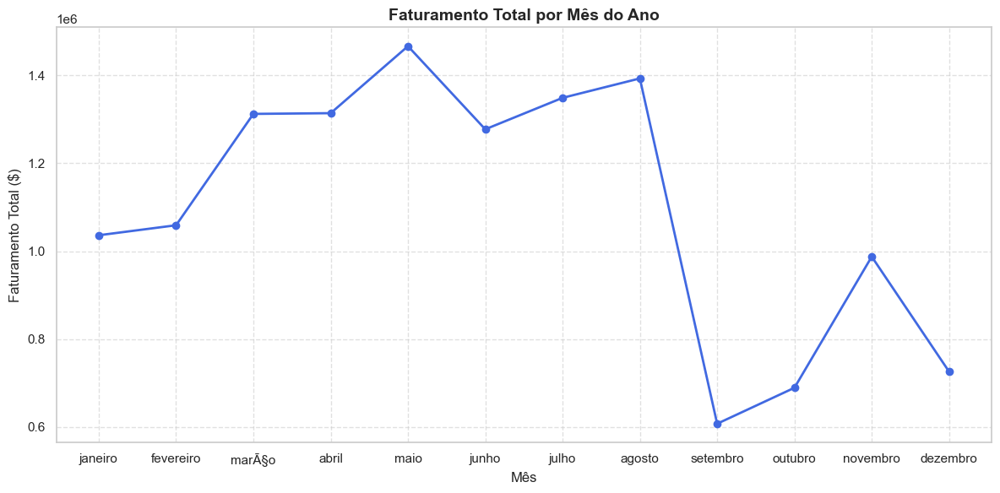

In [ ]:
# Configura o Python para usar os nomes dos meses em português
try:
    locale.setlocale(locale.LC_TIME, 'pt_BR.utf8')
except:
    # Caso rode no Windows, o formato pode ser diferente
    locale.setlocale(locale.LC_TIME, 'portuguese')

df_orders['order_purchase_timestamp'] = pd.to_datetime(df_orders['order_purchase_timestamp'])
df_faturamento = pd.merge(df_order_items, df_orders, on='order_id', how='inner')

# 2. Criar uma coluna com o número do mês (para usar na ordenação correta)
df_faturamento['mes_numero'] = df_faturamento['order_purchase_timestamp'].dt.month

# 3. Criar a coluna com o NOME do mês por extenso (Janeiro, Fevereiro...)
df_faturamento['Mês'] = df_faturamento['order_purchase_timestamp'].dt.strftime('%B')

# 4. Agrupar por número e nome do mês para garantir a soma correta
faturamento_por_mes = df_faturamento.groupby(['mes_numero', 'Mês'])['price'].sum().reset_index()

# 5. Ordenar de Janeiro (1) até Dezembro (12)
faturamento_por_mes = faturamento_por_mes.sort_values(by='mes_numero')

# Deixar o dataframe limpo apenas com o Nome do Mês e o Faturamento
faturamento_final = faturamento_por_mes[['Mês', 'price']].rename(columns={'price': 'Faturamento Total'})

print("--- Tabela de Faturamento por Mês ---")
print(faturamento_final.to_string(index=False))


# --- GERAR O GRÁFICO COM OS NOMES DOS MESES ---

plt.figure(figsize=(12, 6))

# Criar o gráfico de linha
plt.plot(faturamento_final['Mês'], faturamento_final['Faturamento Total'], marker='o', color='royalblue', linewidth=2)

# Configurações visuais
plt.title('Faturamento Total por Mês do Ano', fontsize=14, fontweight='bold')
plt.xlabel('Mês', fontsize=12)
plt.ylabel('Faturamento Total ($)', fontsize=12)

# Adicionar linhas de grade ao fundo
plt.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()


<p style="font-size:14px;">
 Análise Preditiva: Previsão de vendas futuras
</p>
<p style="font-size:14px;">
 Sistema de Recomendação ("Quem comprou X, também levou Y")
Analise quais produtos são frequentemente comprados juntos na mesma ordem (order_id) ou pelo mesmo cliente (customer_unique_id). É a técnica de Market Basket Analysis (Algoritmo Apriori).
Ação de Negócio: Criar combos no site ou enviar e-mails personalizados, exemplo: "Vimos que você comprou uma câmera, que tal levar este cartão de memória com 10% de desconto?".
</p> 

C:\Users\Fabio Kato\AppData\Local\Temp\ipykernel_1620\2693225848.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


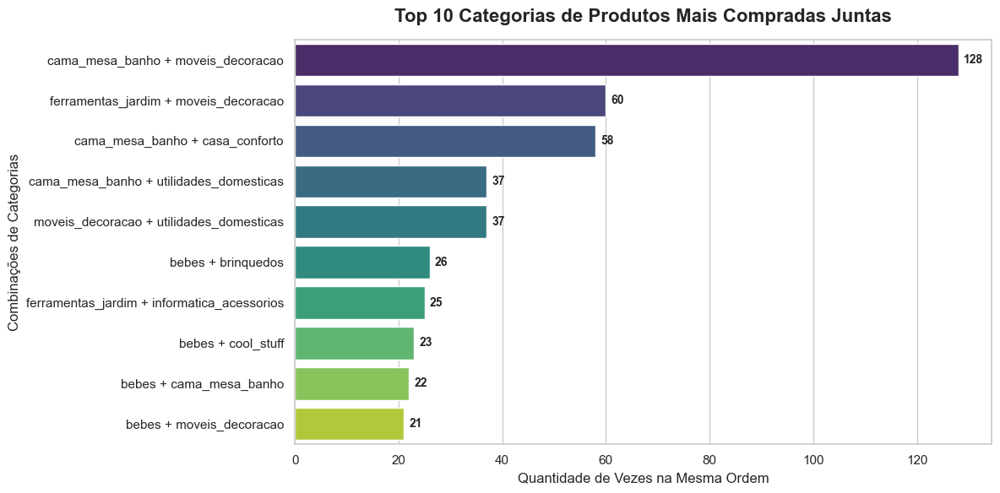

In [ ]:
df = pd.merge(df_order_items[['order_id', 'product_id']], 
              df_products[['product_id', 'product_category_name']], 
              on='product_id')

# 2. Cruzar a tabela com ela mesma para criar os pares de produtos no mesmo pedido
df_pares = pd.merge(df, df, on='order_id')

# 3. Filtrar para evitar duplicados e combinações do produto com ele mesmo
df_combos = df_pares[df_pares['product_category_name_x'] < df_pares['product_category_name_y']].copy()

# 4. Criar o nome do combo (ex: "categoria_A + categoria_B") para exibir no gráfico
df_combos['Combo'] = df_combos['product_category_name_x'] + ' + ' + df_combos['product_category_name_y']

# 5. Contar e pegar os 10 combos mais frequentes
top_10_combos = df_combos['Combo'].value_counts().reset_index()
top_10_combos.columns = ['Combo', 'Quantidade']
top_10_combos = top_10_combos.head(10)


# PARTE DO MATPLOTLIB / SEABORN

# Configurar o tamanho da imagem do gráfico
plt.figure(figsize=(12, 6))

# Criar o gráfico de barras horizontais
sns.barplot(
    x='Quantidade', 
    y='Combo', 
    data=top_10_combos, 
    palette='viridis' # Paleta de cores moderna e gradiente
)

# Adicionar títulos e rótulos
plt.title('Top 10 Categorias de Produtos Mais Compradas Juntas', fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Quantidade de Vezes na Mesma Ordem', fontsize=12)
plt.ylabel('Combinações de Categorias', fontsize=12)

# Adicionar o número exato na ponta de cada barra para facilitar a leitura
for index, value in enumerate(top_10_combos['Quantidade']):
    plt.text(value + 1, index, str(value), va='center', fontsize=10, fontweight='bold')

# Ajustar o layout para não cortar os nomes das categorias
plt.tight_layout()

# Exibir o gráfico na tela
plt.show()

<p style="font-size:14px;">
Conclusão
</p>
<p style="font-size:14px;">
A análise dos dados permitiu compreender de forma abrangente o comportamento dos clientes e a dinâmica financeira do marketplace. Os resultados evidenciaram padrões de consumo, preferências de pagamento e características importantes relacionadas à geração de receita, fornecendo uma visão estratégica sobre o desempenho do negócio.
Os indicadores de RFM mostraram-se especialmente relevantes para a segmentação da base de clientes, permitindo identificar consumidores mais ativos, clientes com maior valor agregado e grupos que demandam ações específicas de retenção e reativação. Essas informações podem servir como base para campanhas de marketing mais eficientes e estratégias de fidelização direcionadas.
A análise do faturamento e dos meios de pagamento também contribuiu para a compreensão dos hábitos de compra dos consumidores, possibilitando a identificação de oportunidades de melhoria nos processos comerciais e financeiros. Além disso, as propostas de análise preditiva e sistemas de recomendação demonstram o potencial dos dados para antecipar tendências, aumentar a conversão de vendas e oferecer experiências mais personalizadas aos clientes.
Dessa forma, conclui-se que a utilização de técnicas de análise de dados não apenas auxilia na interpretação do desempenho atual da empresa, mas também fornece subsídios para decisões estratégicas voltadas ao crescimento sustentável, à melhoria da experiência do cliente e ao aumento da competitividade do negócio.
<p style="font-size:14px;">
 



<h1 style="color:#ED145B; font-family:'Segoe UI';">
4. Satisfação do Cliente
</h1>

<p style="font-size:14px;">

Introdução
</p>

<p style="font-size:14px;">

Esta etapa do relatório analisa os principais motores de satisfação e insatisfação dos clientes do e-commerce Olist.

Investigar a relação entre o desempenho logístico e a percepção de valor do cliente no e-commerce, buscando identificar padrões de falhas que impactam a retenção de clientes para mitigar o risco de churn (evasão de clientes) e garantir a previsibilidade de receita exigida pelos acionistas.

Para este projeto, utilizamos o framework CRISP-DM pela sua eficácia em alinhar dados a objetivos de negócio
</p>



In [ ]:
# Estilos e cores
COR_FIAP = '#ED145B'
COR_ESCURA = '#1E1E1E'
sns.set_theme(style="whitegrid")

<h1 style="color:#ED145B; font-family:'Segoe UI';">
4.1 Ambientação Inicial
</h1>

<p style="font-size:14px;">
Nossa premissa foi isolar apenas pedidos entregues, pois incluir pedidos cancelados ou em processamento distorceria a análise de satisfação, já que esses clientes não experimentaram o ciclo completo de entrega e, consequentemente, não possuem uma percepção de valor consolidada.
Outro ponto de atenção foi o agrupamento da base de pagamentos. Com isso, fomos capazes de somar valores de pedidos com pagamentos múltiplos (ex: dois cartões de crédito), evitando erros de faturamento na nossa base de análise.
</p>


In [ ]:
# Tabela mestra (Merge)

df_orders_clean = df_orders[df_orders['order_status'] == 'delivered'].copy()

colunas_datas_pre = ['order_purchase_timestamp', 'order_delivered_customer_date', 'order_estimated_delivery_date']
for col in colunas_datas_pre:
    df_orders_clean[col] = pd.to_datetime(df_orders_clean[col])

df_orders_clean['diferenca_prazo'] = (df_orders_clean['order_estimated_delivery_date'] - df_orders_clean['order_delivered_customer_date']).dt.days

df_master_sc = df_orders_clean.merge(df_customers, on='customer_id', how='left') \
.merge(df_payments.groupby('order_id')['payment_value'].sum().reset_index(), on='order_id', how='left') \
.merge(df_reviews[['order_id', 'review_score']],on='order_id',how='left')\
.merge(df_order_items, on='order_id', how='left') \
.merge(df_products, on='product_id', how='left') \
.merge(df_category_translation, on='product_category_name', how='left')

if 'review_comment_message' in df_master_sc.columns:
    df_master_sc['review_comment_message'] = (
        df_master_sc['review_comment_message']
        .fillna('Sem comentário')
    )
print("VALIDAÇÃO DA FUNDAÇÃO DOS DADOS")
print(f"Colunas disponíveis ({len(df_master_sc.columns)} colunas): {list(df_master_sc.columns)}")
print(f"Volume de linhas da Tabela Mestra: {len(df_master_sc)}")

VALIDAÇÃO DA FUNDAÇÃO DOS DADOS
Colunas disponíveis (30 colunas): ['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'diferenca_prazo', 'customer_unique_id', 'customer_zip_code_prefix', 'cidade', 'estado', 'payment_value', 'review_score', 'order_item_id', 'product_id', 'seller_id', 'shipping_limit_date', 'price', 'freight_value', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'product_category_name_english']
Volume de linhas da Tabela Mestra: 110816


In [ ]:
df_master_sc.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,diferenca_prazo,customer_unique_id,...,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,7,7c396fd4830fd04220f754e42b4e5bff,...,8.72,utilidades_domesticas,40.0,268.0,4.0,500.0,19.0,8.0,13.0,housewares
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,5,af07308b275d755c9edb36a90c618231,...,22.76,perfumaria,29.0,178.0,1.0,400.0,19.0,13.0,19.0,perfumery
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,17,3a653a41f6f9fc3d2a113cf8398680e8,...,19.22,automotivo,46.0,232.0,1.0,420.0,24.0,19.0,21.0,auto
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,12,7c142cf63193a1473d2e66489a9ae977,...,27.20,pet_shop,59.0,468.0,3.0,450.0,30.0,10.0,20.0,pet_shop
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,9,72632f0f9dd73dfee390c9b22eb56dd6,...,8.72,papelaria,38.0,316.0,4.0,250.0,51.0,15.0,15.0,stationery


In [ ]:
print(f"\nDimensões finais: {df_master_sc.shape[0]} linhas e {df_master_sc.shape[1]} colunas.")


Dimensões finais: 110816 linhas e 30 colunas.


<h1 style="color:#ED145B; font-family:'Segoe UI';">
4.2 Tratamento da Base
</h1>

In [ ]:
# Removemos apenas os pedidos que NÃO possuem nota (pois eles não nos ajudam a medir satisfação)
df_master_sc= df_master_sc.dropna(subset=['review_score'])

# Confirmando se o pagamento é nulo
df_master_sc = df_master_sc.dropna(subset=['payment_value'])

print(f"Linhas após remover pedidos sem nota: {len(df_master_sc)}")

Linhas após remover pedidos sem nota: 109986


In [ ]:
#Verificando nulos
df_master_sc.isnull().sum()

order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                   0
order_delivered_carrier_date        0
order_delivered_customer_date       0
order_estimated_delivery_date       0
diferenca_prazo                     0
customer_unique_id                  0
customer_zip_code_prefix            0
cidade                              0
estado                              0
payment_value                       0
review_score                        0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
product_category_name            1532
product_name_lenght              1532
product_description_lenght       1532
product_photos_qty               1532
product_weight_g                   18
product_leng

<p style="font-size:14px;">
 
 **Datas:** Removeremos os poucos registros (8) onde a data de entrega estava ausente, para garantir a precisão do cálculo de *diferenca_prazo*

 **Categorias:** Preenchemos valores ausentes em categorias com o rótulo "Sem categoria".
</p>

In [ ]:
# TRATAMENTO DE NULOS

# Remoção das linhas críticas (onde a data de entrega é essencial)
df_master_sc = df_master_sc.dropna(subset=['order_delivered_customer_date', 'diferenca_prazo'])

# Preenchimento das categorias ausentes para não perder o registro de venda
df_master_sc['product_category_name'] = df_master_sc['product_category_name'].fillna('Sem categoria')
df_master_sc['product_category_name_english'] = df_master_sc['product_category_name_english'].fillna('no_category')

print(f"Linhas finais após tratamento de nulos: {len(df_master_sc)}")
print("Nulos restantes nas colunas de interesse:", df_master_sc[['product_category_name_english', 'diferenca_prazo']].isnull().sum().sum())
df_master_sc.isnull().sum()

Linhas finais após tratamento de nulos: 109986
Nulos restantes nas colunas de interesse: 0


order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                   0
order_delivered_carrier_date        0
order_delivered_customer_date       0
order_estimated_delivery_date       0
diferenca_prazo                     0
customer_unique_id                  0
customer_zip_code_prefix            0
cidade                              0
estado                              0
payment_value                       0
review_score                        0
order_item_id                       0
product_id                          0
seller_id                           0
shipping_limit_date                 0
price                               0
freight_value                       0
product_category_name               0
product_name_lenght              1532
product_description_lenght       1532
product_photos_qty               1532
product_weight_g                   18
product_leng


<p style="font-size:14px;">

 As colunas com os nulos restantes identificados não impactam na análise final
</p>

In [ ]:
#Checagem de erros lógicos (Entrega antes da compra)
erros_cronologicos = df_master_sc[df_master_sc['order_delivered_customer_date'] < df_master_sc['order_purchase_timestamp']]

print(f"Total de pedidos com erro cronológico (entrega antes da compra): {len(erros_cronologicos)}")

print(f"\nBase de dados: {len(df_master_sc)} linhas.")

Total de pedidos com erro cronológico (entrega antes da compra): 0

Base de dados: 109986 linhas.


In [ ]:
#Remoção de duplicadas

total_duplicadas = df_master_sc.duplicated().sum()

if total_duplicadas > 0:
    df_master_sc.drop_duplicates(inplace=True)
    print("-> Duplicadas removidas com sucesso.")
    print(f"Total de linhas duplicadas encontradas: {total_duplicadas}")
else:
    print("-> Nenhuma linha duplicada (100% idêntica) encontrada.")

print(f"\nBase de dados final validada: {len(df_master_sc)} linhas.")

-> Duplicadas removidas com sucesso.
Total de linhas duplicadas encontradas: 391

Base de dados final validada: 109595 linhas.


In [ ]:
#Colunas de datas
colunas_datas = ['order_purchase_timestamp','order_delivered_customer_date','order_estimated_delivery_date']

# Convertendo para datetime
for col in colunas_datas: df_master_sc[col] = pd.to_datetime(df_master_sc[col])

print("Conversão de data concluída.")

Conversão de data concluída.


<h1 style="color:#ED145B; font-family:'Segoe UI';">
4.3 A Análise
</h1>

<p style="font-size:14px;">

Evolução da Satisfação do Cliente
</p>

<p style="font-size:14px;">

Visão Multitemporal (Histórico, 12m, 6m, 3m)
</p>

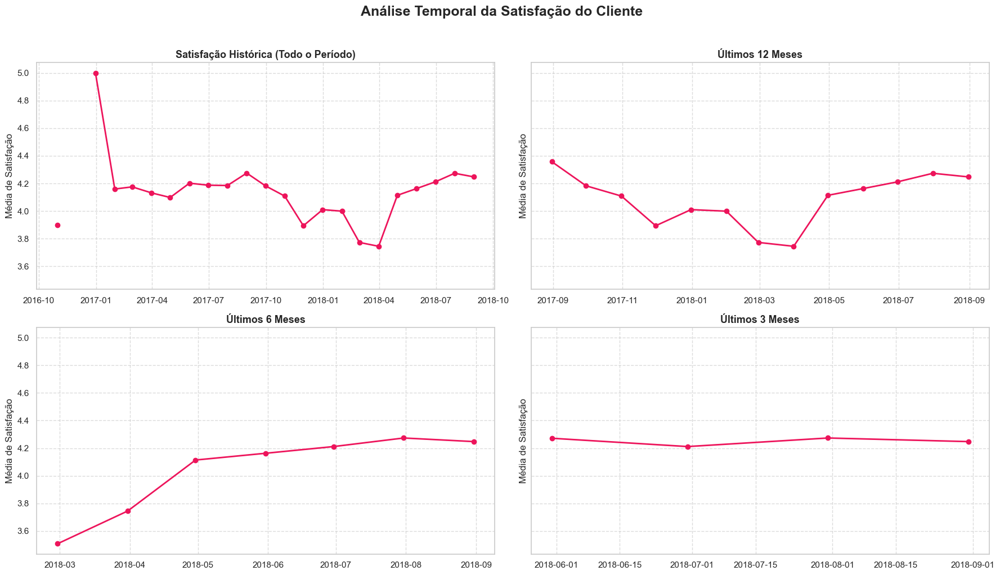

In [ ]:
data_fim = df_master_sc['order_purchase_timestamp'].max()
data_12m = data_fim - pd.DateOffset(months=12)
data_6m  = data_fim - pd.DateOffset(months=6)
data_3m  = data_fim - pd.DateOffset(months=3)

df_historico = df_master_sc
df_12m = df_master_sc[df_master_sc['order_purchase_timestamp'] >= data_12m]
df_6m  = df_master_sc[df_master_sc['order_purchase_timestamp'] >= data_6m]
df_3m  = df_master_sc[df_master_sc['order_purchase_timestamp'] >= data_3m]

#Cálculo da média mensal
def calcular_tendencia(df): return df.set_index('order_purchase_timestamp')['review_score'].resample('ME').mean()

#Gráficos
fig, axes = plt.subplots(2, 2, figsize=(18, 10), sharey=True)

#Dados e títulos
periodos = [
    (df_historico, 'Satisfação Histórica (Todo o Período)', axes[0, 0]),
    (df_12m, 'Últimos 12 Meses', axes[0, 1]),
    (df_6m, 'Últimos 6 Meses', axes[1, 0]),
    (df_3m, 'Últimos 3 Meses', axes[1, 1])
]

for df, titulo, ax in periodos:
    ax.plot(calcular_tendencia(df), marker='o', color=COR_FIAP, linewidth=2)
    ax.set_title(titulo, fontsize=13, fontweight='bold')
    ax.set_ylabel('Média de Satisfação')
    ax.grid(True, linestyle='--', alpha=0.7)

plt.suptitle('Análise Temporal da Satisfação do Cliente', fontsize=18, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

<h1 style="color:#ED145B; font-family:'Segoe UI';">
4.4 Análise de Picos e Quedas
</h1>

In [ ]:
#ANALISE PICO INICIAL
contagem_mensal = df_master_sc.set_index('order_purchase_timestamp').resample('ME')['order_id'].count()

print("Volume de pedidos nos primeiros meses:")
print(contagem_mensal.head())

Volume de pedidos nos primeiros meses:
order_purchase_timestamp
2016-10-31     309
2016-11-30       0
2016-12-31       1
2017-01-31     902
2017-02-28    1836
Freq: ME, Name: order_id, dtype: int64


<p style="font-size:14px;">

***Considerações do Grupo:*** 
Observamos uma volatilidade nos dados iniciais (final de 2026), que atribuímos à baixa representatividade amostral (volume reduzido de pedidos). A partir de meados de 2017, a base estabiliza, permitindo uma análise estatística confiável da satisfação.
</p>

Resumo Mensal (Jan-Abr 2018):
                          review_score  diferenca_prazo
order_purchase_timestamp                               
1                             3.999374        12.046052
2                             3.773195         7.404752
3                             3.745145         5.895502
4                             4.114198        12.135159

PIORES CATEGORIAS (JAN-ABR/2018, >20 vendas):
                                   mean  count
product_category_name_english                 
office_furniture               3.294627    577
furniture_living_room          3.390000    100
fixed_telephony                3.413043     46
audio                          3.613208    106
construction_tools_lights      3.641026     78
fashion_underwear_beach        3.680000     25
christmas_supplies             3.711538     52
home_confort                   3.717949     78
computers_accessories          3.759429   2943
bed_bath_table                 3.766788   3023


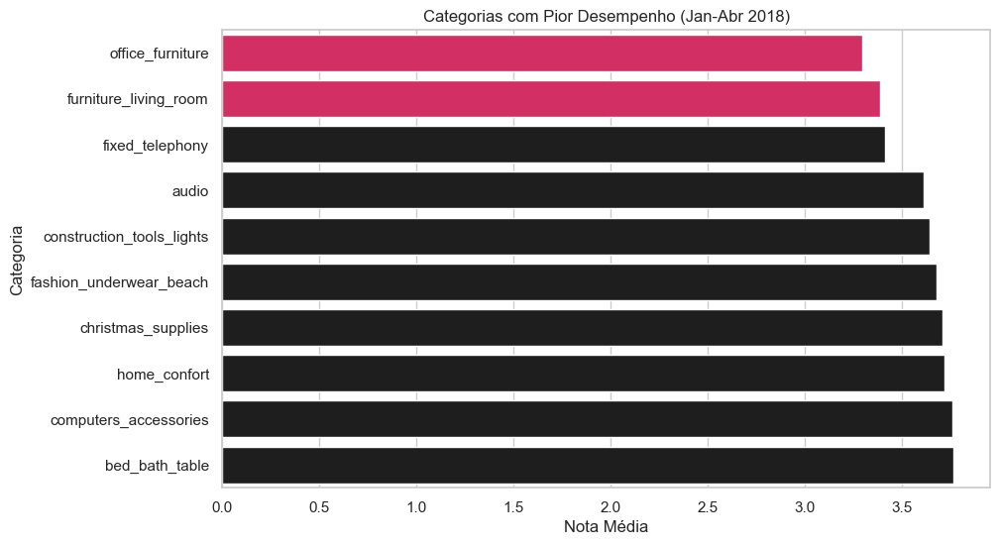

In [ ]:
# ANÁLISE QUEDA PERÍODO JAN A ABRIL/2018

df_periodo = df_master_sc[
    (df_master_sc['order_purchase_timestamp'].dt.year == 2018) & 
    (df_master_sc['order_purchase_timestamp'].dt.month.isin([1, 2, 3, 4]))
].copy()

#Investigação: Médias por mês
resumo_periodo = df_periodo.groupby(df_periodo['order_purchase_timestamp'].dt.month).agg({
    'review_score': 'mean',
    'diferenca_prazo': 'mean'
})
print("Resumo Mensal (Jan-Abr 2018):")
print(resumo_periodo)

#Investigação por categoria
analise_cat = df_periodo.groupby('product_category_name_english')['review_score'].agg(['mean', 'count'])
cat_criticas = analise_cat[analise_cat['count'] > 20].sort_values(by='mean')

print(f"\nPIORES CATEGORIAS (JAN-ABR/2018, >20 vendas):")
print(cat_criticas.head(10))

#Gráfico
plt.figure(figsize=(10, 6))

sns.barplot(data=cat_criticas.head(10).reset_index(), 
            x='mean', 
            y='product_category_name_english', 
            hue='product_category_name_english', 
            palette = [COR_FIAP if i < 2 else COR_ESCURA for i in range(len(cat_criticas.head(10)))], 
            legend=False)

plt.title('Categorias com Pior Desempenho (Jan-Abr 2018)')
plt.xlabel('Nota Média')
plt.ylabel('Categoria')
plt.show()

In [ ]:
# AVALIANDO OS COMENTÁRIOS (Filtramos apenas as 2 primeiras categorias que apareceram como piores)
categorias_ruins = ['office_furniture', 'furniture_living_room', 'fixed_telephony']

df_detalhe = df_master_sc[
    (df_master_sc['product_category_name_english'].isin(categorias_ruins)) &
    (df_master_sc['order_purchase_timestamp'].dt.year == 2018) &
    (df_master_sc['order_purchase_timestamp'].dt.month.isin([1, 2, 3, 4])) &
    (df_master_sc['review_score'] <= 2) # apenas notas ruins (1 e 2)
]

comentarios = df_detalhe[
    (df_detalhe['review_comment_message'].notna()) & 
    (df_detalhe['review_comment_message'] != 'Sem comentário')
][['review_score', 'review_comment_message']]


pd.set_option('display.max_colwidth', None)
display(comentarios.head(10))

KeyError: 'review_comment_message'

<small><strong></strong> 
<p style="font-size:14px;">

**Considerações do Grupo:**
 Nossa análise de causa raiz permite descartar a logística como fator primário de insatisfação, uma vez que observamos uma correlação inversa entre a velocidade de entrega e a satisfação: mesmo com prazos cumpridos, os índices de avaliação mantiveram-se baixos.Identificamos que a "dor" do cliente é predominantemente setorial e de qualidade de produto. Categorias complexas, como 'Móveis de Escritório' e 'Sala', apresentaram as menores notas no primeiro quadrimestre de 2018. A auditoria qualitativa dos comentários confirmou falhas estruturais críticas: componentes ausentes, produtos com peças mal projetadas (fora de medida) e fragilidade extrema nos materiais.
</p>

In [ ]:
# Restante de 2018 (após abril) - Análise de recuperação
df_restante_2018 = df_master_sc[
    (df_master_sc['order_purchase_timestamp'].dt.year == 2018) & 
    (df_master_sc['order_purchase_timestamp'].dt.month > 4)
].copy()

#Calculamos a média das categorias críticas diretamente neste filtro
analise_pos_abril = df_restante_2018[
    df_restante_2018['product_category_name_english'].isin(['office_furniture', 'furniture_living_room'])
].groupby('product_category_name_english')['review_score'].mean()

print("Média das categorias críticas (Mai-Dez/2018):")
print(analise_pos_abril)

Média das categorias críticas (Mai-Dez/2018):
product_category_name_english
furniture_living_room    4.115108
office_furniture         3.815972
Name: review_score, dtype: float64


<p style="font-size:14px;">
 
***Considerações do Grupo:***
Nossa análise longitudinal demonstrou que a queda de satisfação observada no primeiro quadrimestre de 2018 foi efetivamente mitigada ao longo dos meses subsequentes. As categorias anteriormente críticas, Furniture Living Room e Office Furniture, apresentaram uma recuperação expressiva, atingindo médias de 4.11 e 3.81, respectivamente, no período a partir de maio de 2018. Esta trajetória de recuperação valida nossa hipótese de que a insatisfação estava atrelada a problemas pontuais de qualidade de lote ou de catálogo no período inicial. Recomendamos à gestão da Olist a consolidação deste modelo de monitoramento de performance por categoria, visto que ele se provou eficaz como um sistema de alerta precoce para a identificação de falhas de conformidade junto aos fornecedores, garantindo maior previsibilidade na experiência do cliente.
</p>

<small><strong></strong> 

<h1 style="color:#ED145B; font-family:'Segoe UI';">
4.5 O que falta para atingir indices de satisfação maiores?
</h1>

<p style="font-size:14px;">
</p>

***Para entender o que impede a nota de subir para mais próximo de 5.0.***

***Contextualização Estratégica:*** 
Embora a análise longitudinal comprove que a Olist mitigou a crise do primeiro quadrimestre de 2018, estabilizando a nota média em patamares superiores a 4.3, a liderança executiva e os acionistas operam sob a premissa da melhoria contínua. Em um mercado hipercompetitivo, a estabilização não é o destino final; o objetivo é alcançar a excelência (scores próximos a 5.0), o que maximiza a fidelização e reduz drasticamente o Custo de Aquisição de Clientes (CAC) no longo prazo.

***O Raciocínio Analítico:***
Para romper esse "teto operacional" de 4.3, precisamos mudar a abordagem analítica. Não estamos mais procurando grandes colapsos operacionais, mas sim detratores sistêmicos e silenciosos. A nota 4.3 indica que a operação geral funciona bem, mas existe um grupo residual de fricção que atua como uma "âncora" na média global. Avaliaremos duas hipóteses estruturais a partir de Maio de 2018:

<ul>
    <li><strong>Hipótese 1 (Princípio de Pareto - Produto):</strong> Uma minoria de categorias ou produtos específicos responde pela maioria das notas 1 e 2 remanescentes. Se isolarmos e corrigirmos esses focos, a média global subirá organicamente.</li>
    <li><strong>Hipótese 2 (Gargalo Estrutural Geográfico):</strong> A nota não atinge a excelência devido a limitações de infraestrutura logística em estados específicos (regiões geograficamente distantes dos centros de distribuição principais), gerando prazos longos que penalizam a experiência do cliente de forma permanente.</li>
</ul>

<h1 style="color:#ED145B; font-family:'Segoe UI';">
5.1 Hipótese 1
</h1>

C:\Users\Fabio Kato\AppData\Local\Temp\ipykernel_4016\3220545240.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=detratores_categoria.head(10), x='product_category_name_english',


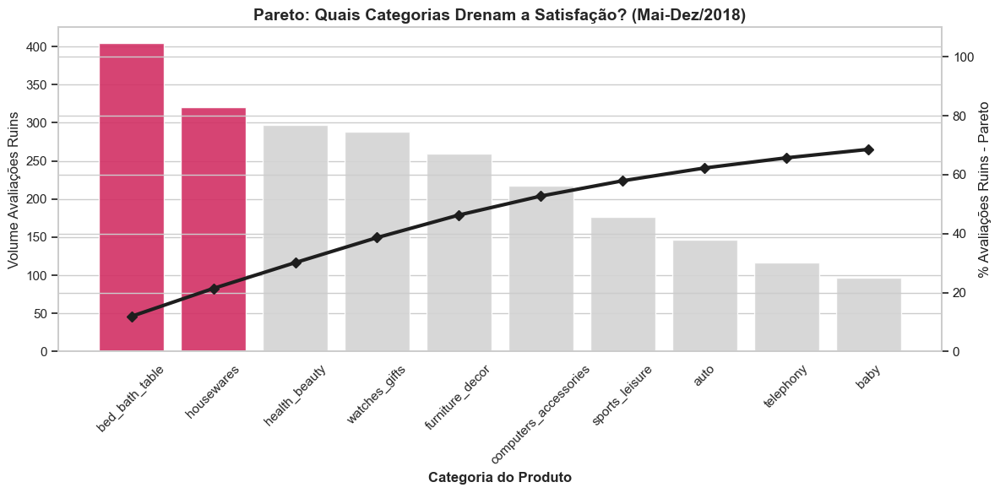

In [ ]:
# HIPÓTESE 1: PARETO DE PRODUTOS

df_restante_cat = df_restante_2018.copy()
detratores_categoria = df_restante_cat[df_restante_cat['review_score'] <= 2] \
    .groupby('product_category_name_english').size() \
    .reset_index(name='volume_notas_ruins') \
    .sort_values(by='volume_notas_ruins', ascending=False)

# Pareto
total_reclamacoes = detratores_categoria['volume_notas_ruins'].sum()
detratores_categoria['cum_pct'] = detratores_categoria['volume_notas_ruins'].cumsum() / total_reclamacoes * 100

# Configuração do gráfico
COR_FIAP = '#ED145B'
COR_ESCURA = '#1E1E1E'
COR_CINZA_CLARO = '#D3D3D3'

sns.set_theme(style="whitegrid")
cores = [COR_FIAP if i < 2 else COR_CINZA_CLARO for i in range(10)]

fig, ax1 = plt.subplots(figsize=(12, 6))

sns.barplot(data=detratores_categoria.head(10), x='product_category_name_english', 
            y='volume_notas_ruins', ax=ax1, palette=cores, alpha=0.9)

ax1.set_ylabel('Volume Avaliações Ruins', fontsize=12)
ax1.set_xlabel('Categoria do Produto', fontsize=12, fontweight='bold')
ax1.set_title('Pareto: Quais Categorias Drenam a Satisfação? (Mai-Dez/2018)', fontsize=14, fontweight='bold')
ax1.tick_params(axis='x', rotation=45)

ax2 = ax1.twinx()
ax2.plot(detratores_categoria.head(10)['product_category_name_english'], 
         detratores_categoria.head(10)['cum_pct'], color=COR_ESCURA, marker='D', linewidth=3)

ax2.set_ylabel('% Avaliações Ruins - Pareto', fontsize=12, color=COR_ESCURA)
ax2.set_ylim(0, 110)
ax2.tick_params(axis='y', labelcolor=COR_ESCURA)

plt.tight_layout()
plt.show()

<p style="font-size:14px;">

***Considerações do Grupo:***
Através da aplicação do Princípio de Pareto, diagnosticamos que a insatisfação residual não é um problema sistêmico generalizado, mas sim um desvio de performance concentrado em segmentos específicos.
Mapeamos todas as reclamações (notas 1 e 2) por categoria de produto a partir de maio de 2018.
As categorias bed_bath_table e housewares (em destaque) representam o foco crítico de falhas.
</p>

In [ ]:
#Isolando apenas as categorias problemáticas conforme pareto no período pós-abril/2018
# alvos = ['bed_bath_table', 'housewares']
df_investigacao = df_restante_2018[(df_restante_2018['product_category_name_english'].isin(alvos)) & 
(df_restante_2018['review_score'] <= 2)]

#O que os clientes estão dizendo?
comentarios_alvos = df_investigacao[df_investigacao['review_comment_message'] != 'Sem comentário']

pd.set_option('display.max_colwidth', None)
print("AMOSTRA DE COMENTÁRIOS: CAMA/MESA/BANHO E UTILIDADES")
display(comentarios_alvos[['product_category_name_english', 'review_score', 'review_comment_message']].head(15))

#A culpa é da categoria ou de vendedores ruins?
viloes_vendedores = df_investigacao.groupby('seller_id').size().reset_index(name='volume_reclamacoes') \
.sort_values(by='volume_reclamacoes', ascending=False)

#Calculando o percentual de culpa de cada vendedor dentro dessas categorias ruins
total_reclamacoes_alvo = viloes_vendedores['volume_reclamacoes'].sum()
viloes_vendedores['%_de_culpa'] = (viloes_vendedores['volume_reclamacoes'] / total_reclamacoes_alvo) * 100

print("TOP 5 VENDEDORES COM MAIS RECLAMAÇÕES NESSAS CATEGORIAS")
display(viloes_vendedores.head())

#AVALIAÇÃO LOGÍSTICA: Validando se a entrega foi a culpada

status_logistica = df_investigacao['diferenca_prazo'].apply(lambda x: 'No Prazo / Adiantado' if x >= 0 else 'Atrasado')

validacao_prazo = status_logistica.value_counts(normalize=True) * 100

print("VALIDAÇÃO LOGÍSTICA DOS PEDIDOS COM NOTA 1 e 2")
print(validacao_prazo.round(2).astype(str) + '%')

NameError: name 'alvos' is not defined

<small><strong>Considerações do Grupo:</strong> Após o gráfico de Pareto apontar que as categorias bed_bath_table (Cama, Mesa e Banho) e <em>housewares</em> (Utilidades Domésticas) concentravam o maior volume residual de notas 1 e 2 no período pós-crise (Mai-Dez/2018), realizamos um duplo isolamento analítico: uma auditoria qualitativa dos comentários deixados pelos clientes e um mapeamento de concentração por identificador de fornecedor.

O objetivo foi testar as nossas hipóteses de negócio. Precisávamos entender se a insatisfação que impede a Olist de atingir a nota de excelência (próxima a 5.0) era um problema sistêmico da plataforma, um gargalo generalizado de transporte ou se era uma falha pontual de conformidade de produtos e parceiros comerciais específicos.

A análise dos comentários evidenciou que a frustração do consumidor ocorre no momento da abertura da embalagem e desmistificamos a ideia de que o atraso logístico seria o grande vilão deste período (apenas 12.95% atrasados nos pedidos com nota 1 e 2). 

Algumas das frustrações identificadas:
- Recebimento de caixas com quantidades menores do que o solicitado.
- Envio de mercadorias com cores, tamanhos e especificações diferentes do que foi comprado no site.
- Produtos frágeis, tecidos com espessura inadequada e materiais sem o devido acabamento de manufatura (madeiras não lixadas ou componentes fora de medida).

Análise de Fornecedores que mais falham:
- O fornecedor líder de reclamações (ID: `96955fee9216a65b617aa5c0531780ce`) responde sozinho por 35,92% de todas as avaliações negativas observadas nessas categorias.
- O segundo maior ofensor acumula 24,40% das ocorrências. 
- Juntos, apenas dois parceiros detêm mais de 60% do total de problemas analíticos isolados.

 A  conclusão do grupo, neste aspecto, é que a Olist possui um problema de governança e monitoramento de contratos com poucos fornecedores não conformes. Trata-se de um cenário ideal para a eficiência de gestão: em vez de despender energia e recursos financeiros tentando auditar milhares de lojistas cadastrados na plataforma, a liderança consegue mover o ponteiro da satisfação global de forma imediata com uma ação cirúrgica nestes dois principais fornecedores, como por exemplo:
 - uma suspensão cautelar do faturamento dos dois principais *sellers* identificados para a revisão urgente de seus processos internos de expedição e qualidade de lote
 - aplicação de multas contratuais automáticas baseadas em gatilhos de avaliações de comportamento operacional
 - implementação de uma trava sistêmica no ecossistema da Olist que restrinja temporariamente anúncios de fornecedores cujo índice de notas 1 e 2 ultrapasse o teto tolerável de conformidade em um período de 15 dias

<h1 style="color:#ED145B; font-family:'Segoe UI';">
5.2 Hipótese 2
</h1>

IMPACTO DOS ATRASOS NA SATISFAÇÃO
Nota média dos pedidos com atraso: 2.55
Nota média dos pedidos SEM atraso: 4.21
TOP 5 ESTADOS COM MAIS PEDIDOS ATRASADOS (VOLUME BRUTO)
customer_state
SP    2635
RJ    1798
MG     689
BA     492
RS     421
dtype: int64
TAXA DE ATRASO POR ESTADO (% DO TOTAL DO ESTADO)
customer_state
AL    23.708920
MA    19.799499
SE    15.817694
PI    15.444015
CE    15.238764
dtype: float64
PARETO: VENDEDORES QUE CONCENTRAM 80% DOS ATRASOS


,seller_id,qtd_atrasos,%_participacao_atraso,cum_pct
398,4a3ca9315b744ce9f8e9374361493884,214,2.503510,2.503510
192,1f50f920176fa81dab994f9023523100,178,2.082358,4.585868
392,4869f7a5dfa277a7dca6462dcf3b52b2,131,1.532522,6.118390
98,1025f0e2d44d7041d6cf58b6550e0bfa,130,1.520824,7.639214
683,7c67e1448b00f6e969d365cea6b010ab,129,1.509125,9.148339
549,6560211a19b47992c3666cc44a7e94c0,123,1.438933,10.587272
1257,ea8482cd71df3c1969d7b9473ff13abc,122,1.427234,12.014506
819,955fee9216a65b617aa5c0531780ce60,117,1.368741,13.383248
1177,da8622b14eb17ae2831f4ac5b9dab84a,110,1.286851,14.670098
1096,cc419e0650a3c5ba77189a1882b7556a,105,1.228358,15.898456


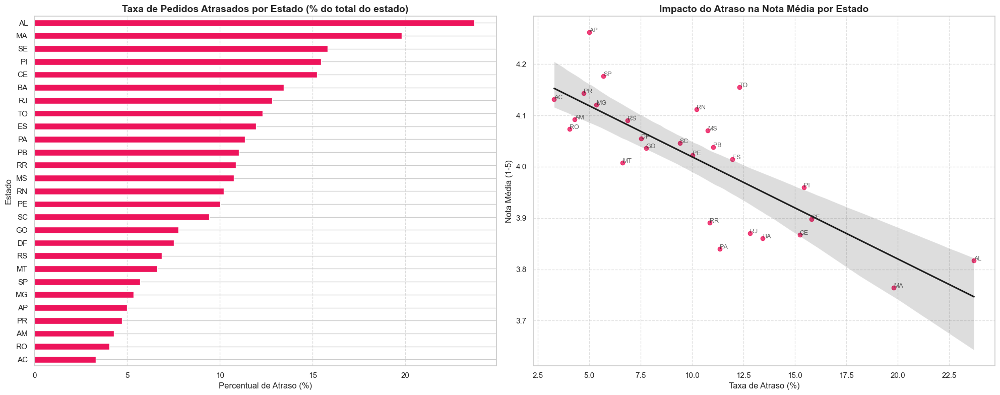

In [ ]:
# Qual a nota média gerada pelos atrasos?
df_atrasos = df_master_sc[df_master_sc['diferenca_prazo'] < 0].copy()
df_no_prazo = df_master_sc[df_master_sc['diferenca_prazo'] >= 0].copy()

print(f"IMPACTO DOS ATRASOS NA SATISFAÇÃO")
print(f"Nota média dos pedidos com atraso: {df_atrasos['review_score'].mean():.2f}")
print(f"Nota média dos pedidos SEM atraso: {df_no_prazo['review_score'].mean():.2f}")

# Quais estados sofrem mais com atrasos?
atrasos_por_estado_vol = df_atrasos.groupby('customer_state').size().sort_values(ascending=False)
total_por_estado = df_master_sc.groupby('customer_state').size()
taxa_atraso_estado = (atrasos_por_estado_vol / total_por_estado * 100).fillna(0).sort_values(ascending=False)

print("TOP 5 ESTADOS COM MAIS PEDIDOS ATRASADOS (VOLUME BRUTO)")
print(atrasos_por_estado_vol.head(5))

print("TAXA DE ATRASO POR ESTADO (% DO TOTAL DO ESTADO)")
print(taxa_atraso_estado.head(5))

# Pareto dos fornecedores que mais atrasam
fornecedores_atraso = df_atrasos.groupby('seller_id').size().reset_index(name='qtd_atrasos') \
    .sort_values(by='qtd_atrasos', ascending=False)
fornecedores_atraso['%_participacao_atraso'] = (fornecedores_atraso['qtd_atrasos'] / fornecedores_atraso['qtd_atrasos'].sum()) * 100
fornecedores_atraso['cum_pct'] = fornecedores_atraso['%_participacao_atraso'].cumsum()
pareto_atraso = fornecedores_atraso[fornecedores_atraso['cum_pct'] <= 80]

print("PARETO: VENDEDORES QUE CONCENTRAM 80% DOS ATRASOS")
display(pareto_atraso.head(10))

# Gráficos
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Gráfico 1: Taxa de Atraso por Estado
taxa_atraso_estado.sort_values(ascending=True).plot(kind='barh', ax=ax1, color='#ED145B')
ax1.set_title('Taxa de Pedidos Atrasados por Estado (% do total do estado)', fontsize=14, fontweight='bold')
ax1.set_xlabel('Percentual de Atraso (%)')
ax1.set_ylabel('Estado')
ax1.grid(axis='x', linestyle='--', alpha=0.7)

# Gráfico 2: Correlação Atraso vs Nota Média
df_analise_correlacao = pd.DataFrame({
    'taxa_atraso': taxa_atraso_estado,
    'nota_media': df_master_sc.groupby('customer_state')['review_score'].mean()
})

sns.regplot(data=df_analise_correlacao, x='taxa_atraso', y='nota_media', ax=ax2, color='#1E1E1E', scatter_kws={'color': '#ED145B'})
ax2.set_title('Impacto do Atraso na Nota Média por Estado', fontsize=14, fontweight='bold')
ax2.set_xlabel('Taxa de Atraso (%)')
ax2.set_ylabel('Nota Média (1-5)')
ax2.grid(True, linestyle='--', alpha=0.6)

for estado, row in df_analise_correlacao.iterrows():
    ax2.annotate(estado, (row['taxa_atraso'], row['nota_media']), fontsize=9, alpha=0.7)

plt.tight_layout()
plt.show()

<small><strong>Considerações do Grupo:</strong> Isolando o impacto logístico na satisfação do cliente, confirmamos que, embora a qualidade do produto seja o principal motor de insatisfação, o atraso logístico atua como um potente "acelerador de detratores". A disparidade entre a nota média de pedidos entregues no prazo (4.21) e com atraso (2.55) evidencia que um atraso é, por si só, um evento crítico que anula a percepção de valor do cliente, derrubando o score em quase 40%.

Ao analisarmos a geografia do atraso, verificamos que o volume bruto de atrasos em estados como SP e RJ é esperado pelo alto volume de vendas. Sendo assi, é a taxa de falha (percentual) que realmente revela um gargalo operacional grave nas regiões Nordeste e Norte (estados como AL (23.7%), MA (19.8%) e SE (15.8%), por exemplo, apresentam altos indices de ineficiencia).

Além disso, ao cruzar o Pareto dos fornecedores que mais atrasam, identificamos que a grande maioria dos atrasos está concentrada em um grupo  de sellers. Não precisamos revisar toda a base, mas sim aplicar um regime de "monitoramento de exceção" para estes parceiros específicos, condicionando a manutenção de seus contratos à redução imediata dos índices de atraso, assim como sugerido anteriormente para os fornecedores com mais reclamações nas categorias de produtos detratores.

Analisando os gráficos, é possível perceber que quanto maior a taxa de atraso de um estado, menor é a nota média (score) dada pelos clientes. Além disso, o atraso não segue uma regra de "quanto mais longe, pior". Se a distância fosse o único problema, os estados do Norte (como AC, RO, AM) teriam as piores taxas de atraso. Isso indica que o problema da Olist é específico de certas rotas ou transportadoras parceiras nessas regiões.

Recomendações :
- Implementação de um SLA diferenciado e mais rigoroso para transportadoras que operam nas rotas para AL, MA e SE. Se o parceiro logístico não consegue manter o índice de atraso abaixo de 10% nestas regiões, a viabilidade de manutenção do contrato deve ser reavaliada.
- Para os vendedores identificados no topo do nosso Pareto de atrasos, recomendamos uma trava sistêmica que restrinja sua atuação em estados com alta taxa de atraso.
- Em estados com histórico comprovado de alta taxa de atraso, o checkout da Olist deve ajustar automaticamente a "Data Estimada de Entrega" com uma margem de segurança maior. É preferível que o cliente veja um prazo longo e receba antes, do que prometer um prazo curto e falhar, gerando a nota 2.55.

<h1 style="color:#ED145B; font-family:'Segoe UI';">
5.3 O preço influencia no score?
</h1>

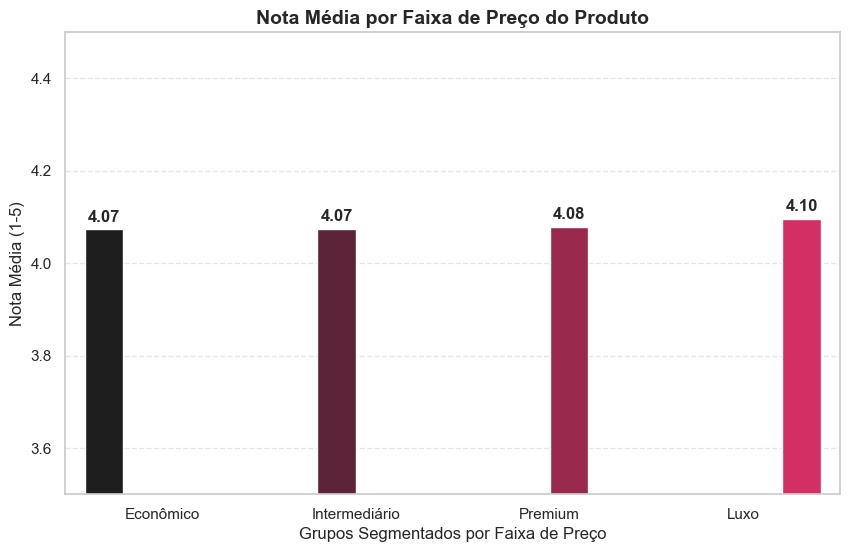

In [ ]:
# Definição das cores
COR_FIAP = '#ED145B'
COR_ESCURA = '#1E1E1E'
paleta_fiap = [COR_ESCURA, '#661937', '#AB1646', COR_FIAP]

# Divisão em faixas de preço
df_master_sc['price_group'] = pd.qcut(df_master_sc['price'], 4, labels=['Econômico', 'Intermediário', 'Premium', 'Luxo'])
analise_preco = df_master_sc.groupby('price_group', observed=False)['review_score'].mean().reset_index()

# Gráfico
plt.figure(figsize=(10, 6))
bars = sns.barplot(data=analise_preco, x='price_group', y='review_score', palette=paleta_fiap, hue='price_group', legend=False)

for p in bars.patches:
    bars.annotate(format(p.get_height(), '.2f'), 
    (p.get_x() + p.get_width() / 2., p.get_height()), 
    ha = 'center', va = 'center', 
    xytext = (0, 9), 
    textcoords = 'offset points',
    fontweight='bold')

plt.title('Nota Média por Faixa de Preço do Produto', fontsize=14, fontweight='bold')
plt.ylim(3.5, 4.5)
plt.ylabel('Nota Média (1-5)')
plt.xlabel('Grupos Segmentados por Faixa de Preço')
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.show()

<small><strong>Considerações do Grupo:</strong> A análise segmentada demonstra uma estabilidade notável na nota média de avaliação, variando apenas 0.03 pontos entre as faixas extremas (Econômico a Luxo). Este comportamento indica que a satisfação do cliente na Olist não é fortemente determinada pelo custo do produto, mas sim pela experiência de serviço (logística e conformidade)

<h1 style="color:#ED145B; font-family:'Segoe UI';">
5.4 Impactos Financeiros
</h1>



**Logística vs. Qualidade do Produto: Onde dói mais?**

<small> Para avaliar o impacto real das falhas operacionais na rentabilidade do marketplace, optou-se pela aplicação de custos de fricção (overhead) sobre as ocorrências de atrasos logísticos e falhas de qualidade. A adoção de premissas financeiras fundamenta-se nos custos ocultos que acompanham cada evento, indo além do valor transacionado, por exemplo: <p>
- Custo Logístico: O custo de R$ 25,00 por pedido atrasado acima de 3 dias não representa o frete, mas a fricção operacional. Esta premissa considera o custo de Suporte ao Cliente (SAC) (dados de mercado indicam que pedidos com atrasos críticos elevam a frequência de chamados de suporte em 2,5 vezes em comparação a pedidos entregues no prazo).

- Fundamentação da Margem de Prejuízo por Qualidade: A premissa de 30% do valor do produto para falhas de qualidade (notas 1 a 3) baseia-se no Custo Total de Logística Reversa, um benchmark consolidado no varejo brasileiro + efeito da Devolução: O processo de logística reversa engloba a coleta, o frete de retorno, a conferência de estoque e o reprocessamento financeiro do estorno + desvalorização do Ativo (produtos devolvidos por desconformidade ou defeito raramente retornam ao inventário como mercadoria de primeiro nível. A desvalorização imediata para venda como outlet ou refurbished, somada aos custos logísticos diretos, compõe o industry standard que oscila entre 25% e 35% do valor unitário. O valor de 30% foi adotado como a média conservadora de mercado para esta operação).

<p> Além disso, a aplicação de uma "tolerância de 3 dias" para o cálculo do impacto logístico evita a contaminação da análise por ruídos de atrasos negligenciáveis, focando a atenção da gestão apenas em falhas críticas que impactam a experiência do cliente e a margem líquida. Da mesma forma, a classificação de notas 1 a 3 como prejuízo por qualidade é justificada pela necessidade de manter uma taxa de satisfação elevada em um mercado altamente competitivo, onde a nota 3 não é interpretada como um indicador de retenção.

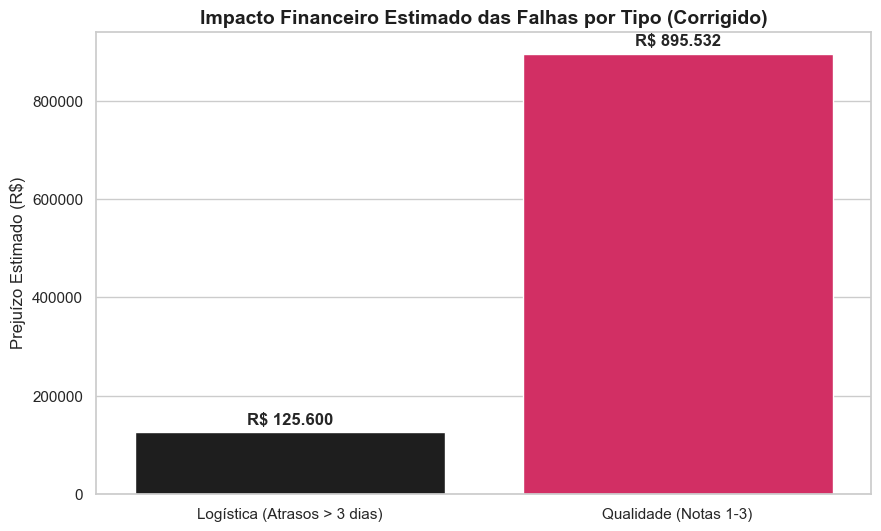

In [ ]:
import numpy as np

# Base de pedidos únicos para não duplicar o custo logístico
df_pedidos_unicos = df_master_sc.drop_duplicates(subset=['order_id']).copy()

# Premissas:
CUSTO_LOGISTICA_UNIT = 25.00
PCT_PREJUIZO_QUALIDADE = 0.30
#Assumimos 30% do valor do produto como custo estimado de reversa (logística + SAC + custo de oportunidade), conforme práticas de mercado para e-commerce de varejo

# Logística: Conta apenas 1 vez por pedido único
custo_logistica_total = np.where(df_pedidos_unicos['diferenca_prazo'] < -3, CUSTO_LOGISTICA_UNIT, 0).sum()

# Qualidade: Continua na master, pois o preço é do item individual
custo_qualidade_total = np.where(df_master_sc['review_score'] <= 3, df_master_sc['price'] * PCT_PREJUIZO_QUALIDADE, 0).sum()

# Gráfico
dados_financeiros = pd.DataFrame({
    'Tipo de Falha': ['Logística (Atrasos > 3 dias)', 'Qualidade (Notas 1-3)'],
    'Prejuízo Estimado (R$)': [custo_logistica_total, custo_qualidade_total]
})

plt.figure(figsize=(10, 6))
bars = sns.barplot(data=dados_financeiros, x='Tipo de Falha', y='Prejuízo Estimado (R$)', 
                   palette=[COR_ESCURA, COR_FIAP], hue='Tipo de Falha', legend=False)

for p in bars.patches:
    bars.annotate(f'R$ {p.get_height():,.0f}'.replace(',', '.'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   xytext = (0, 9), 
                   textcoords = 'offset points',
                   fontweight='bold')

plt.title('Impacto Financeiro Estimado das Falhas por Tipo (Corrigido)', fontsize=14, fontweight='bold', color=COR_ESCURA)
plt.ylabel('Prejuízo Estimado (R$)')
plt.xlabel('')
plt.show()

<h1 style="color:#ED145B; font-family:'Segoe UI';">
5.5 Como está a retenção desses clientes insatisfeitos? Eles compram de novo?
</h1>

In [ ]:
# Clientes com mais de uma compra
pedidos_cliente = (
    df_master_sc.groupby('customer_unique_id')['order_id']
    .nunique()
)

clientes_recompra = pedidos_cliente[pedidos_cliente > 1].index

# Base por cliente (uma linha por cliente)
clientes = (
    df_master_sc
    .sort_values('order_purchase_timestamp')
    .drop_duplicates('customer_unique_id')
    [['customer_unique_id', 'review_score']]
    .copy()
)

clientes['recomprou'] = clientes['customer_unique_id'].isin(clientes_recompra)

clientes['satisfacao'] = clientes['review_score'].apply(
    lambda x: 'Satisfeito' if x >= 4 else 'Insatisfeito'
)

analise_final = (
    clientes.groupby('satisfacao')['recomprou']
    .mean()
    .mul(100)
)

print(analise_final)

satisfacao
Insatisfeito    2.824888
Satisfeito      3.021730
Name: recomprou, dtype: float64


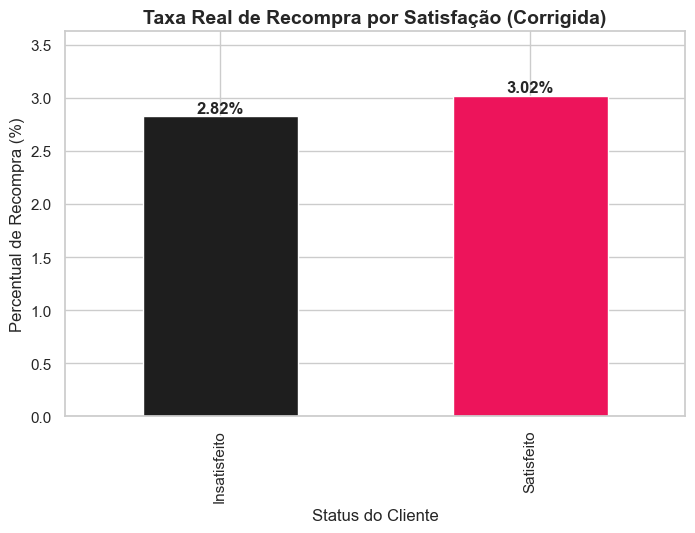

In [ ]:
# Gráfico com os dados limpos (pedidos reais)
plt.figure(figsize=(8, 5))
ax = analise_final.plot(kind='bar', color=[COR_ESCURA, COR_FIAP])

plt.title('Taxa Real de Recompra por Satisfação (Corrigida)', fontsize=14, fontweight='bold')
plt.ylabel('Percentual de Recompra (%)')
plt.xlabel('Status do Cliente')
plt.ylim(0, max(analise_final) * 1.2) # Ajuste automático da escala

# Adicionar os rótulos de dados
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='bottom', fontweight='bold')

plt.show()

<h1 style="font-size: 20px; color: #ED145B;">3. Conclusão</h1>

<p style="font-size:14px;">
 
 **Conclusão:**
Ao final da análise de satisfação do cliente, concluímos que a satisfação do cliente na Olist não é explicada por um único fator isolado, mas por uma combinação de qualidade do produto, desempenho logístico e consistência operacional ao longo do tempo. A base mostrou que a operação passou por uma fase de maior instabilidade, mas depois apresentou recuperação clara, indicando que a empresa conseguiu corrigir parte relevante dos problemas observados no primeiro quadrimestre de 2018.

De forma mais específica, identificamos que a insatisfação mais crítica esteve concentrada em categorias pontuais de produtos, especialmente em itens como office_furniture, furniture_living_room, bed_bath_table e housewares, com reclamações muito ligadas a falhas de conformidade, peças faltantes, produto diferente do anunciado e baixa qualidade de acabamento. Isso mostra que, em muitos casos, o problema não estava na experiência de compra no site em si, mas na entrega de valor real do produto em relação ao que foi prometido ao cliente.

Ao mesmo tempo, a análise logística confirmou que atrasos têm impacto direto e muito forte na percepção do consumidor: pedidos atrasados apresentaram nota média bem inferior aos pedidos entregues no prazo, o que evidencia que a pontualidade não é apenas um detalhe operacional, mas um determinante da satisfação. Ainda assim, os dados também mostraram que o atraso atua mais como um acelerador de insatisfação do que como a causa principal em todos os cenários, já que a qualidade do produto permaneceu como o principal ponto de dor em várias análises.

Outro ponto importante foi a análise de preço, que indicou pouca influência da faixa de valor sobre o score final. Ou seja, o cliente não avaliou melhor apenas por comprar produtos mais caros ou mais baratos, o que mais pesou foi a experiência entregue, principalmente em relação ao estado do produto recebido, à comunicação com o vendedor e ao cumprimento do prazo. Isso reforça que a variável decisiva para elevar a satisfação não é preço, e sim execução.

Do ponto de vista financeiro, a conclusão é que falhas de qualidade e atrasos geram custos relevantes para o marketplace, seja por suporte, devoluções, fricção operacional ou perda de retenção. Além disso, a análise de recompra sugere que clientes insatisfeitos tendem a apresentar ligeira menor fidelização, o que transforma problemas operacionais em perdas de receita.

Portanto, é possível perceber que a Olist já demonstrou capacidade de recuperação e estabilização, mas ainda depende de um controle muito mais rígido sobre qualidade de fornecedores, padronização de catálogo e redução de atrasos para alcançar um patamar de excelência. Em síntese, a empresa não precisa necessáriamente vender mais: precisa garantir que o que vende seja entregue no prazo, conforme prometido e com qualidade consistente. É isso que, de fato, sustenta notas mais altas, maior retenção e melhor resultado financeiro no longo prazo.

</p>


#### <span style="color: red">1.Rotas críticas</span>

In [ ]:
#IMPORTANDO BANCO DE DADOS PARA VARIÁVEIS

customers = pd.read_csv('olist_customers_dataset.csv')
geolocation = pd.read_csv('olist_geolocation_dataset.csv')
order_items = pd.read_csv('olist_order_items_dataset.csv')
order_payments = pd.read_csv('olist_order_payments_dataset.csv')
order_reviews = pd.read_csv('olist_order_reviews_dataset.csv')
orders = pd.read_csv('olist_orders_dataset.csv')
products = pd.read_csv('olist_products_dataset.csv')
sellers = pd.read_csv('olist_sellers_dataset.csv')
product_category_name_translation = pd.read_csv('product_category_name_translation.csv')


In [ ]:
#Otimização de frete em rotas críticas
# Unindo as tabelas

base = orders.merge(customers, on= 'customer_id',
                    how= 'left')
base = base.merge(order_items,on='order_id',
                  how='left')
base = base.merge(sellers, on='seller_id',
                  how='left')

NameError: name 'orders' is not defined

In [ ]:
#Tratando as informações nulas e duplicadas
base_analise = base.dropna()
base_analise.duplicated().sum()

#Juntando as rotas vendedor → cliente
base_analise['rota'] = base_analise['seller_state'] +  ' → '  + base_analise['customer_state']
rotas = base_analise['rota']

#Rotas com maiores quantidades de pedidos
display(rotas.value_counts().head(20))

rota
SP → SP    35416
SP → RJ     9401
SP → MG     8565
SP → RS     4132
SP → PR     3609
PR → SP     3338
MG → SP     2900
SP → SC     2709
SP → BA     2626
MG → MG     1669
SP → GO     1657
SP → ES     1621
SP → DF     1565
SC → SP     1487
RJ → SP     1472
MG → RJ     1275
SP → PE     1246
PR → RJ     1115
SP → CE     1090
RJ → RJ     1086
Name: count, dtype: int64

In [ ]:
#Analisando o frete por rotas
analise_frete = base_analise.groupby('rota').agg({'order_id': 'count', 'freight_value': 'mean'})
analise_frete.columns = ['qtd_pedidos', 'frete_medio']

#Filtro 
rotas_relevantes = analise_frete[analise_frete['qtd_pedidos'] > 700]

display(rotas_relevantes.sort_values(by='frete_medio', ascending=False).head(10))


,qtd_pedidos,frete_medio
rota,,
SP → PA,765,31.706523
SP → CE,1090,30.949835
SP → PE,1246,30.910754
SP → MT,761,25.356189
MG → RJ,1275,24.590227
SP → BA,2626,24.318819
RS → SP,749,23.531055
PR → MG,925,23.251524
PR → RJ,1115,22.419031


In [ ]:
#Transformando colunas de data para datatime
base_analise['order_delivered_customer_date'] = pd.to_datetime(base_analise['order_delivered_customer_date'])
base_analise['order_estimated_delivery_date'] = pd.to_datetime(base_analise['order_estimated_delivery_date'])

#Criando coluna de atraso
base_analise['atraso_dias'] = (base_analise['order_delivered_customer_date'] - base_analise['order_estimated_delivery_date']).dt.days

#Analisando atraso médio por rota
atraso_rotas = base_analise.groupby('rota').agg({'order_id': 'count', 'atraso_dias': 'mean'})
atraso_rotas.columns = ['qtd_pedidos', 'atraso_medio']

#Filtro
atraso_rotas = atraso_rotas[atraso_rotas['qtd_pedidos'] > 700]

display(atraso_rotas.sort_values(by='atraso_medio', ascending=False).head(5))


,qtd_pedidos,atraso_medio
rota,,
SP → ES,1621,-9.600247
SP → SP,35416,-10.229134
SP → BA,2626,-10.933359
SP → SC,2709,-11.035068
SP → RJ,9401,-11.120094


#### Obs: Rotas mais relevantes não possuem atraso médio.

In [ ]:
#Analisando percentual de pedidos atrasados por rota
base_analise['pedido_atrasado'] = (base_analise['atraso_dias'] > 0)
percentual_atraso = base_analise.groupby('rota').agg({'order_id': 'count', 'pedido_atrasado': 'mean'})
percentual_atraso.columns = ['qtd_pedidos', 'percentual_atraso']
percentual_atraso['percentual_atraso'] *= 100

#Filtro
percentual_atraso = percentual_atraso[percentual_atraso['qtd_pedidos'] > 700]

display(percentual_atraso.sort_values(by='percentual_atraso', ascending=False).head(10))


,qtd_pedidos,percentual_atraso
rota,,
SP → CE,1090,13.669725
SP → RJ,9401,13.498564
SP → BA,2626,12.757045
SP → ES,1621,12.152992
SP → PA,765,11.764706
PR → RJ,1115,11.121076
SP → SC,2709,9.265412
SP → PE,1246,9.229535
MG → RJ,1275,8.000000


In [ ]:
percentual_atraso = percentual_atraso.drop(columns='qtd_pedidos')

In [ ]:
#Analise final
analise_final = analise_frete.merge(percentual_atraso, on='rota')

#Criando indice de criticidade
analise_final['indice_criticidade'] = (analise_final['frete_medio'] * analise_final ['percentual_atraso'])

display(analise_final.sort_values(by='indice_criticidade', ascending=False).head(11))


,qtd_pedidos,frete_medio,percentual_atraso,indice_criticidade
rota,,,,
SP → CE,1090,30.949835,13.669725,423.075724
SP → PA,765,31.706523,11.764706,373.017916
SP → BA,2626,24.318819,12.757045,310.236273
SP → PE,1246,30.910754,9.229535,285.291875
SP → RJ,9401,20.390007,13.498564,275.235820
SP → ES,1621,20.544207,12.152992,249.673586
PR → RJ,1115,22.419031,11.121076,249.323757
MG → RJ,1275,24.590227,8.000000,196.721820
SP → SC,2709,20.809439,9.265412,192.808016


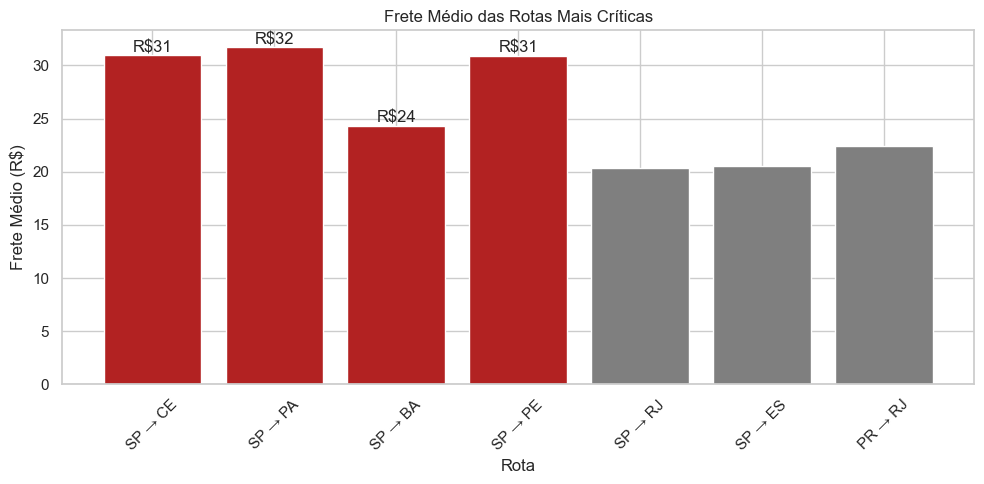

In [ ]:
#Criando gráfico de Frete médio das rotas mais críticas

top_rotas = analise_final.sort_values(by='indice_criticidade',ascending=False).head(7)
top_rotas = top_rotas.reset_index()
rotas_destaque = [
    'SP → PA',
    'SP → CE',
    'SP → PE',
    'SP → BA']
cores = ['firebrick' if rota in rotas_destaque else '#7F7F7F'for rota in top_rotas['rota']]


plt.figure(figsize=(10,5))

barras = plt.bar(
    top_rotas['rota'],
    top_rotas['frete_medio'],
    color=cores)

for barra, rota, valor in zip(
    barras,
    top_rotas['rota'],
    top_rotas['frete_medio']
):
    
    if rota in rotas_destaque:
        
        plt.text(
            barra.get_x() + barra.get_width()/2,
            barra.get_height(),
            f'R${valor:.0f}',  # ou .0f para sem decimais
            ha='center',
            va='bottom'
        )

plt.title('Frete Médio das Rotas Mais Críticas')
plt.xlabel('Rota')
plt.ylabel('Frete Médio (R$)')

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

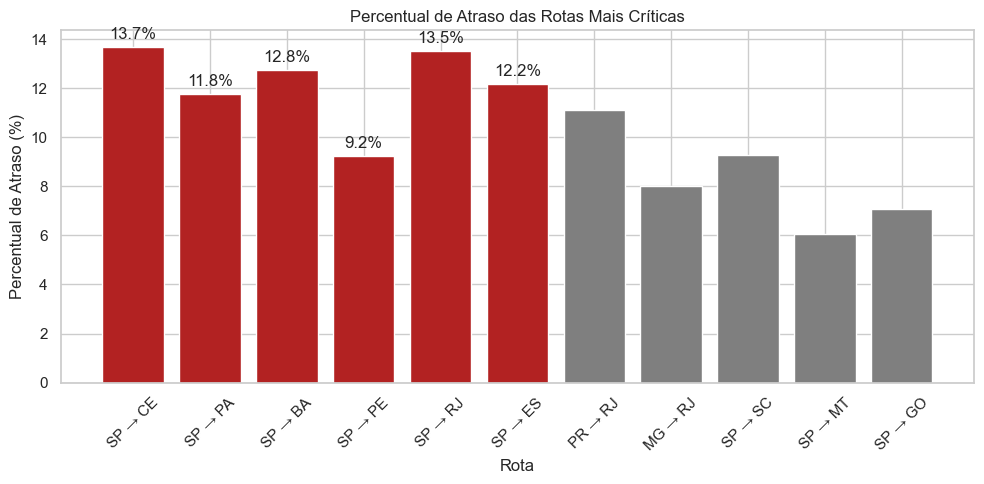

In [ ]:
#Criando gráfico 

top_rotas = analise_final.sort_values(
    by='indice_criticidade',
    ascending=False
).head(11)

top_rotas = top_rotas.reset_index()

rotas_destaque = [
    'SP → PA',
    'SP → CE',
    'SP → PE',
    'SP → BA',
    'SP → ES',
    'SP → RJ'
    
]

cores = [
    'firebrick' if rota in rotas_destaque else '#7F7F7F'
    for rota in top_rotas['rota']
]

plt.figure(figsize=(10,5))

barras = plt.bar(
    top_rotas['rota'],
    top_rotas['percentual_atraso'],
    color=cores
)

# Mostrar percentual apenas nas rotas destacadas
for barra, rota, valor in zip(
    barras,
    top_rotas['rota'],
    top_rotas['percentual_atraso']
):
    
    if rota in rotas_destaque:
        
        plt.text(
            barra.get_x() + barra.get_width()/2,
            barra.get_height() + 0.2,
            f'{valor:.1f}%',
            ha='center',
            va='bottom'
        )

plt.title('Percentual de Atraso das Rotas Mais Críticas')
plt.xlabel('Rota')
plt.ylabel('Percentual de Atraso (%)')

plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

### Problematização
##### Rotas originadas em São Paulo com destino às regiões Norte e Nordeste apresentaram simultaneamente maiores custos médios de frete e maiores taxas de atraso, indicando possíveis gargalos logísticos associados à distância e concentração operacional. Apesar da curta distância entre São Paulo e Rio de Janeiro, a rota apresentou elevada taxa de atraso possivelmente associada ao alto volume operacional.

### Insight
##### Rotas partindo de São Paulo para Nordeste apresentaram alto custo logístico e elevada taxa de atraso. A descentralização do estoque através de centros de distribuição regionais poderia reduzir distância percorrida, custo médio de frete e prazo de entrega. Em concomitante, a expansão da base de vendedores em regiões estratégicas como Norte e Nordeste contribuiria para a otimização do frete.

### <span style="color: red">2.Pricing/cross-sell por categoria/região</span>

In [ ]:
#Estratégias de pricing/cross-sell por categoria/região.

#Colunas úteis
orders_comercial = orders[['order_id','customer_id']]
customers_comercial = customers[['customer_id','customer_state']]
order_items_comercial = order_items[['order_id','product_id','price','freight_value']]
products_comercial = products[['product_id','product_category_name']]

#Juntando as tabelas
base_comercial = orders_comercial.merge(customers_comercial, on= 'customer_id',
                    how= 'left')
base_comercial = base_comercial.merge(order_items_comercial,on='order_id',
                  how='left')
base_comercial = base_comercial.merge(products_comercial, on='product_id',
                  how='left')

#Tratando as informações nulas
base_comercial = base_comercial.dropna()





In [ ]:
#Categorias mais vendidas por região
categoria_regiao = base_comercial.groupby(['customer_state', 'product_category_name']).agg({'order_id': 'count','price': 'mean'})
categoria_regiao.columns = ['qtd_vendas','ticket_medio']

display (categoria_regiao.sort_values(by='qtd_vendas', ascending=False).head(30).reset_index())

,customer_state,product_category_name,qtd_vendas,ticket_medio
0,SP,cama_mesa_banho,5235,91.362850
1,SP,beleza_saude,4204,109.967940
2,SP,esporte_lazer,3667,105.360515
3,SP,moveis_decoracao,3531,81.197400
4,SP,utilidades_domesticas,3265,84.342613
5,SP,informatica_acessorios,3170,110.646019
6,SP,relogios_presentes,2281,190.710180
7,SP,automotivo,1747,122.654419
8,SP,brinquedos,1712,108.388919
9,SP,telefonia,1646,63.237108


In [ ]:
#Ticket médio por categoria
ticket_categoria = (base_comercial.groupby('product_category_name').agg({'order_id': 'count','price': 'mean'}))
ticket_categoria.columns = ['qtd_vendas', 'ticket_medio']

display(ticket_categoria.sort_values(by='ticket_medio',ascending=False).head(20).reset_index())


,product_category_name,qtd_vendas,ticket_medio
0,pcs,203,1098.340542
1,portateis_casa_forno_e_cafe,76,624.285658
2,eletrodomesticos_2,238,476.124958
3,agro_industria_e_comercio,212,342.124858
4,instrumentos_musicais,680,281.616000
5,eletroportateis,679,280.778468
6,portateis_cozinha_e_preparadores_de_alimentos,15,264.568667
7,telefonia_fixa,264,225.693182
8,construcao_ferramentas_seguranca,194,208.992371
9,relogios_presentes,5991,201.135984


#### Obs: Os itens com maiores ticket médio não são os que mais vendem.

In [ ]:
#Ticket médio por estado
ticket_estado = (base_comercial.groupby('customer_state').agg({'order_id': 'count','price': 'mean'}))
ticket_estado.columns = ['qtd_vendas', 'ticket_medio']

display(ticket_estado.sort_values(by='ticket_medio',ascending=False))


,qtd_vendas,ticket_medio
customer_state,,
PB,592,189.994493
AL,440,181.226886
AC,90,176.845000
RO,272,167.503603
AP,82,164.320732
PI,535,161.383009
PA,1061,160.008341
TO,310,158.418548
RN,523,157.660497


In [ ]:
# Cruzando categoria + região
categoria_regiao = categoria_regiao[categoria_regiao['qtd_vendas'] > 700]

display(categoria_regiao.sort_values(by='ticket_medio',ascending=False).head(10).reset_index())

,customer_state,product_category_name,qtd_vendas,ticket_medio
0,RJ,relogios_presentes,874,212.104863
1,SP,relogios_presentes,2281,190.710180
2,SP,cool_stuff,1364,156.295374
3,MG,beleza_saude,1086,145.081308
4,RJ,beleza_saude,1064,136.558853
5,SP,bebes,1276,122.818777
6,SP,automotivo,1747,122.654419
7,RJ,esporte_lazer,1041,120.219059
8,RJ,informatica_acessorios,1002,120.049351
9,MG,esporte_lazer,966,116.686532


#### Obs2:A categoria relogios_presentes apresenta elevado ticket médio e volume relevante em RJ e SP, indicando potencial para estratégias de pricing premium e campanhas direcionadas para consumidores de maior valor agregado.

#### Obs3: A categoria beleza_saude combina alto volume de vendas com ticket médio consistente, tornando-se candidata ideal para campanhas de upsell (oferecer versão mais avançada do produto ao cliente) e bundles promocionais (venda de conjuntos em um único pacote da categoria).

In [ ]:
#Verificando se há pedidos com múltiplos produtos:
itens_por_pedido = (base_comercial.groupby('order_id')['product_category_name'].nunique())
display((itens_por_pedido > 1).sum())
itens_por_pedido.describe()

np.int64(727)

count    97277.000000
mean         1.007628
std          0.088758
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          3.000000
Name: product_category_name, dtype: float64

In [ ]:
#Análise de receita estimada
categoria_regiao['receita_estimada'] = (categoria_regiao['qtd_vendas'] * categoria_regiao['ticket_medio'])
categoria_regiao.sort_values(by='receita_estimada',ascending=False).head(20).reset_index()

,customer_state,product_category_name,qtd_vendas,ticket_medio,receita_estimada
0,SP,cama_mesa_banho,5235,91.362850,478284.52
1,SP,beleza_saude,4204,109.967940,462305.22
2,SP,relogios_presentes,2281,190.710180,435009.92
3,SP,esporte_lazer,3667,105.360515,386357.01
4,SP,informatica_acessorios,3170,110.646019,350747.88
5,SP,moveis_decoracao,3531,81.197400,286708.02
6,SP,utilidades_domesticas,3265,84.342613,275378.63
7,SP,automotivo,1747,122.654419,214277.27
8,SP,cool_stuff,1364,156.295374,213186.89
9,SP,brinquedos,1712,108.388919,185561.83


#### Obs4: Nota-se que informatica_acessorios é interessante também, visto a grande quantidade de vendas, ticket médio elevado e uma boa receita estimada, além de que normalmente possui muitos produtos complementares, como mouse, teclado, headset, webcam, possibilitando a estratégia de cross sell (venda cruzada dos itens).

#### <span style="color: red">3.Priorizando vendedores com alta avaliação e baixo tempo de entrega</span>


In [ ]:
#Criando tempo de entrega
orders['tempo_entrega'] = (pd.to_datetime(orders['order_delivered_customer_date']) - pd.to_datetime(orders['order_purchase_timestamp'])).dt.days

seller_performance = (order_items[['order_id', 'seller_id']].merge(orders[['order_id', 'tempo_entrega']],on='order_id',
how='left').merge(order_reviews[['order_id', 'review_score']],on='order_id',how='left'))

#Agrupando por vendedores
seller_analise = (seller_performance.groupby('seller_id').agg({'order_id': 'count','tempo_entrega': 'mean','review_score': 'mean'}))
seller_analise.columns = ['qtd_pedidos','tempo_medio_entrega','nps_medio']

#Filtrando vendedores relevantes
seller_analise = seller_analise[seller_analise['qtd_pedidos'] >= 400]

display(seller_analise.sort_values(by=['nps_medio', 'tempo_medio_entrega'], ascending=[False, True]).head(22))

,qtd_pedidos,tempo_medio_entrega,nps_medio
seller_id,,,
fa1c13f2614d7b5c4749cbc52fecda94,586,12.839378,4.340206
9f505651f4a6abe901a56cdc21508025,431,7.737705,4.283372
7a67c85e85bb2ce8582c35f2203ad736,1175,10.668680,4.234991
8581055ce74af1daba164fdbd55a40de,443,12.331019,4.230769
dbc22125167c298ef99da25668e1011f,430,10.954545,4.226107
f8db351d8c4c4c22c6835c19a46f01b0,726,9.423184,4.218837
620c87c171fb2a6dd6e8bb4dec959fc6,804,12.429479,4.215190
a1043bafd471dff536d0c462352beb48,770,13.123670,4.189048
46dc3b2cc0980fb8ec44634e21d2718e,542,11.320611,4.181308


#### Sellers com avaliações médias superiores a 4 estrelas e tempo médio de entrega inferior a 11 dias apresentaram melhor desempenho operacional. Recomenda-se priorizar esses vendedores em campanhas promocionais, programas de destaque e recomendações da plataforma, visto que são mais sucetíveis a satisfação do cliente.